# C133 Team 5 Model 2: Linear and Polynomial Regression Model (Refer to Section 4 Directly)

Done by Mak Chee Cheng
(Section 1, 2, 3 is outdated. please refer to the 'Data Preprocessing, Cleaning and Exploratory Analysis.ipynb' for latest version)

### Section 1: Introduction and Observations
### Section 2: Cleaning
### Section 3: Exploratory Analysis
### Section 4: Model 2: Linear Polynomial Regression Model

In [4]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
import plotly.express as px
sb.set() # set the default Seaborn style for graphics

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingRegressor

from statistics import mean, median, mode, stdev
from math import sqrt


# Section 1: Introduction and Observations
Import and print the data# import and print the data

## objective of this project
3 main objectives / problems we are going to solve -> we are going to predict the the rating star of the phone
1) Help brands to improve their future qualities of phone by predicting the stars based on the phones specifications  <br>
2) Identify the most prominent variables and features of a phone resuting in a high star rating  <br>
3) Help users find the best rated phone that suit their preferences  <br>

In [5]:
original = pd.read_csv('mobiles.csv')
original.head()

,Unnamed: 0,names,images_links,stars,rating&reviews,price_details,memory,camara_info,display,battery,processor,warranty
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
2,2,itel it2163S,https://rukminim1.flixcart.com/image/312/312/l...,4.1,702 Ratings & 67 Reviews,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,9 Indian Input Language Support,"BT Caller, Kingtalker"
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",https://rukminim1.flixcart.com/image/312/312/x...,4.4,"1,20,759 Ratings & 7,003 Reviews","₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...


In [6]:
original.dtypes



Unnamed: 0          int64
names              object
images_links       object
stars             float64
rating&reviews     object
price_details      object
memory             object
camara_info        object
display            object
battery            object
processor          object
warranty           object
dtype: object

In [7]:
original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1148 entries, 0 to 1147
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      1148 non-null   int64  
 1   names           943 non-null    object 
 2   images_links    1143 non-null   object 
 3   stars           922 non-null    float64
 4   rating&reviews  922 non-null    object 
 5   price_details   1143 non-null   object 
 6   memory          943 non-null    object 
 7   camara_info     943 non-null    object 
 8   display         943 non-null    object 
 9   battery         943 non-null    object 
 10  processor       900 non-null    object 
 11  warranty        616 non-null    object 
dtypes: float64(1), int64(1), object(10)
memory usage: 107.8+ KB


### Observation 1, insignificant columns
1) from the discribed table we are able to see that images_links does not have any data analysis value. They are simply links for the images of the phone. therefore can be dropped.  <br>
2) warranty of the phone varies as the user are able to extend their  warranty, therefore not important in this analysis and will be dropped  <br>
3) the ratings and review columns are the same for the same brand and not the rating for each different type of phones, therefore not applicable to predict which phone is better. and will be dropped  <br>

### Observation 2, all the columns except the stars are in string/object format
1) cleaning and formatting is needed so that the data can be analysed

a) names - a new column will be created that substring the brand (catergorical)  <br>
b) price_details - the original price of the phone will be extracted from the string and convert to sgd (numerical)  <br>
c) memory - contais 3 main component, the ram, rom, expandable storage(sd card) (numeric, numeric, boolean)  <br>
d) camera info - the highest rear camera and front camera will be taken (numerical)  <br>
e) display - will be split into 2 variable, the size and type (numerical)  <br>
f) battery - the number of the battery size is extracted (numerical)  <br>
g) processor - due to the amount of vast processor, we will only be   extracting the brand (cateogorical)  <br>

Final columns
a) names  <br>
b) price  <br>
c) ram  <br>
d) rom  <br>
e) expandable Y/N  <br>
f) front_camera  <br>
g) rear_camera  <br>
h) display_size  <br>
i) display_type  <br>
j) battery  <br>
k) processor DONE  <br>
l) color DONE  <br>
m) brand DONE  <br>

### Obeservation 3, the rows with apple phone seems to have an error in its storage section

1) extra details are inserted into the rows of apple from other sources

### Observation 4 there are alot of null values
total rows is 1148, rows with names and model, 943
1148-943 = 205 null phones
all will be removed

After Observation 2 is done then we will do the explratory analysis
- 1. show all the different type for catogorical. and the number of data in that category show 
- 2. for numerical show the describe (mean mode) box plot, scatter plot 
- 3. for both data types show the count of outliers
- 3. does any of the variables have any relationship with the stars?

# Section 2: Cleaning
Besed on the observations above, we will proceed to clean the dataset
<br>
drop image_link and ratings_review and warranty

In [8]:
dropped = original.drop(columns=['images_links','rating&reviews','warranty'])
dropped = original.drop(columns=['images_links','rating&reviews'])

dropped.head()

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,9 Indian Input Language Support,"BT Caller, Kingtalker"
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...


# Remove null rows

In [9]:
dropped = dropped.dropna(subset=['names'])
dropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      900 non-null    object 
 9   warranty       616 non-null    object 
dtypes: float64(1), int64(1), object(8)
memory usage: 81.0+ KB


In [10]:
#create a column with the brand only using the names column
dropped['Brand']= dropped['names'].str.split(' ').str[0]


In [11]:
dropped.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      900 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
dtypes: float64(1), int64(1), object(9)
memory usage: 88.4+ KB


In [12]:
print(dropped['Brand'])

0        SAMSUNG
1        SAMSUNG
2           itel
3        SAMSUNG
4        SAMSUNG
          ...   
1138        vivo
1139        LAVA
1140       Tecno
1141    Kechaoda
1142       APPLE
Name: Brand, Length: 943, dtype: object


In [13]:
#it is observed that the apple rows have their processor saved in battery
#the following 2 row are used to transfer the row from battery to processor
#we then replace the battery with NA
dropped.loc[dropped['Brand'].str.upper()=='APPLE', 'processor'] = dropped['battery']
dropped.loc[dropped['Brand'].str.upper()=='APPLE', 'battery'] = 'NA'

#a few of the rows for processor does not have value, we replace with NA
dropped['processor'] = dropped['processor'].fillna('NA')

#afew rows have their warranty save under processor, we will replace it with NA
dropped.loc[dropped['processor'].str.upper().str.contains('YEAR'), 'processor'] = 'NA'

dropped.loc[dropped['processor'].str.upper().str.contains('LANGUAGE'), 'processor'] = 'NA'
dropped.loc[dropped['processor'].str.upper().str.contains('MONTH'), 'processor'] = 'NA'
dropped.loc[dropped['processor'].str.upper().str.contains('NA PROCESSOR'), 'processor'] = 'NA'

print(dropped['Brand']=='APPLE')

0       False
1       False
2       False
3       False
4       False
        ...  
1138    False
1139    False
1140    False
1141    False
1142     True
Name: Brand, Length: 943, dtype: bool


In [14]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix


In [15]:
dropped['Brand'].describe()

count      943
unique      40
top       itel
freq       120
Name: Brand, dtype: object

In [16]:
dropped['processor'].describe()

count     943
unique    121
top        NA
freq      339
Name: processor, dtype: object

In [17]:
#create a column called color from the name.
dropped['Color']= dropped['names'].str.split(',').str[0].str.split(' ').str[-1]
dropped['Color']= dropped['Color'].str.split('(').str[-1].str.upper()
dropped.loc[dropped['Color'].str.upper().str.contains('IT'), 'Color'] = 'NA'
dropped.loc[dropped['Color'].str.upper().str.contains('VIR'), 'Color'] = 'NA'
dropped.loc[dropped['Color'].str.upper().str.contains('SS'), 'Color'] = 'NA'
dropped.loc[dropped['Color'].str.upper().str.contains('GRAY'), 'Color'] = 'GREY'

dropped['Color'].head(100)

0        BLUE
1      COPPER
2          NA
3       GREEN
4        BLUE
        ...  
115      BLUE
116     BLACK
117      BLUE
118        NA
119      GOLD
Name: Color, Length: 100, dtype: object

In [18]:
dropped['Color'].describe()

count     943
unique    151
top        NA
freq      170
Name: Color, dtype: object

## plot color to see if there is any relation to the rating (most likely not used as too many null)

In [19]:
#apple rows
print(dropped[dropped['Brand']=='APPLE'])

      Unnamed: 0                                           names  stars  \
16            16              APPLE iPhone 14 (Midnight, 128 GB)    4.7   
33            33                 APPLE iPhone 11 (White, 128 GB)    4.6   
42            42             APPLE iPhone 14 (Starlight, 128 GB)    4.7   
43            43                 APPLE iPhone 11 (Black, 128 GB)    4.6   
71            71                APPLE iPhone 14 (Purple, 128 GB)    4.7   
74            74                  APPLE iPhone 14 (Blue, 128 GB)    4.7   
78            78                  APPLE iPhone 11 (Black, 64 GB)    4.6   
184          184                 APPLE iPhone 12 (Black, 128 GB)    4.6   
235          235                  APPLE iPhone 11 (White, 64 GB)    4.6   
244          244                  APPLE iPhone 13 (Blue, 128 GB)    4.7   
255          255        APPLE iPhone 14 Plus (Starlight, 128 GB)    4.7   
263          263          APPLE iPhone 14 ((PRODUCT)RED, 128 GB)    4.7   
293          293         

In [20]:
#Memory section

dropped['Ram']= dropped['memory'].str.split('|').str[0]
dropped['Rom']= dropped['memory'].str.split('|').str[1]

#expandable or not column 
dropped.loc[dropped['memory'].str.upper().str.contains('EXPAND'), 'expandable'] = 1;
dropped['expandable'] = dropped['expandable'].fillna('0')


# replace the missing values with 0
dropped['Ram'] = dropped['Ram'].fillna('0 GB RAM')
dropped['Rom'] = dropped['Rom'].fillna('0 GB ROM')

#if the rom column contain ram and if the ram clomun comtain rom
dropped.loc[dropped['Ram'].str.upper().str.contains('ROM'), 'Rom'] = dropped['Ram'];
dropped.loc[dropped['Ram'].str.upper().str.contains('ROM'), 'Ram'] = '0 GB RAM';
dropped.loc[dropped['Rom'].str.upper().str.contains('Ram'), 'Ram'] = dropped['Rom'];
dropped.loc[dropped['Rom'].str.upper().str.contains('Ram'), 'Rom'] = '0 GB ROM';

#if the column contain NA RAM or NA ROM replace with 0 GB OR if they contain other data
dropped.loc[~dropped['Ram'].str.upper().str.contains('RAM') | dropped['Ram'].str.upper().str.contains('NA') , 'Ram'] = '0 GB RAM';
dropped.loc[~dropped['Rom'].str.upper().str.contains('ROM') | dropped['Rom'].str.upper().str.contains('NA') , 'Rom'] = '0 GB ROM';

# strip leading and trailing whitespace from the new columns
dropped['Ram'] = dropped['Ram'].str.strip()
dropped['Rom'] = dropped['Rom'].str.strip()


#convert ram and rom to numbers
dropped.loc[dropped['Ram'].str.upper().str.contains('MB'), 'Ram'] = str(dropped['Ram'].str.split(' ').str[0].astype('float') / 1000) + 'GB RAM'
dropped.loc[dropped['Rom'].str.upper().str.contains('MB'), 'Rom'] = str(dropped['Rom'].str.split(' ').str[0].astype('float') / 1000) + 'GB ROM'

#convert to float
dropped.loc[dropped['Ram'].str.upper().str.contains('RAM'), 'Ram'] = dropped['Ram'].str.split(' ').str[0].astype('float')
dropped.loc[dropped['Rom'].str.upper().str.contains('ROM'), 'Rom'] = dropped['Rom'].str.split(' ').str[0].astype('float')

dropped.to_csv('dropped.csv', index=False)

In [21]:
#apple 

dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 14'), 'Ram'] = 6.0
dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 13'), 'Ram'] = 4.0
dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 12'), 'Ram'] = 4.0
dropped.loc[dropped['names'].str.upper().str.contains('IPHONE 11'), 'Ram'] = 4.0



## things observed while formatting ram and rom

1) diff row have very different way of formatting their rom and ram  <br>
4 GB RAM | 64 GB ROM | Expandable Upto 1 TB  <br>
8 GB RAM | 128 GB ROM  <br>
128 GB ROM  <br>
NA ROM  <br>
6.6 cm (2.6 inch) QVGA Display  <br>
8 MB RAM | 8 MB ROM | Expandable Upto 32 GB  <br>
8 MB ROM | Expandable Upto 32 GB  <br>
### ! there are too many types of formatting, thus simply splitting wont work.
1) splitting will cause some ram column to have the rom value - thus need to swap  <br>
2) rows without data/NAN will be replace by 0 GB  <br>
3) after split can convert to int/float as there are some rows with screen data or NA RAM/ROM  <br>
4) replace all the rows with 'NA', or other strings that dont have 'RAM' or 'ROM' with 0  <br>
5) there is a mix of MB and GB, thus we need to convert those in mb by /1000  <br>
6) APPLE brand do not have ram data thus need to find external sources and input (40 rows)  <br>

NOTE: export to csv to check error

In [22]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand,Color,Ram,Rom,expandable
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,64.0,1.0
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,COPPER,4.0,64.0,1.0
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel,NA,0.0,0.0,1.0
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,GREEN,4.0,128.0,1.0
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,128.0,1.0
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,PURPLE,4.0,64.0,1.0
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI,NA,0.0,0.0,1.0
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLACK,4.0,64.0,1.0
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLUE,4.0,64.0,1.0
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,GREEN,4.0,64.0,1.0


In [23]:
dropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
dtypes: float64(3), int64(1), object(11)
memory usage: 150.2+ KB


# CHEE CHENG PART

In [24]:
# Split camera_info  column into two new columns , Rear Camera and Front Camera
dropped[['Rear Camera', 'Front Camera']] = dropped.camara_info.str.split("|", expand = True)
dropped[['Rear Camera', 'Front Camera']].describe()


,Rear Camera,Front Camera
count,943,527
unique,107,19
top,0.3MP Rear Camera,16MP Front Camera
freq,136,174


In [25]:
print(dropped["Rear Camera"].unique())

['50MP + 5MP + 2MP ' '1200 mAh Lithium Ion Battery' '13Mp + AI Lens '
 '2MP Rear Camera' '13MP Rear Camera ' '13MP + 2MP + 2MP '
 '50MP + 8MP + 2MP ' '50MP + 2MP ' '64MP + 8MP + 2MP ' '12MP + 12MP '
 '8MP Rear Camera ' '13MP + 2MP ' '0.3MP Rear Camera'
 '50MP + 2MP + 0.3MP ' '0MP Front Camera' '50MP + 8MP ' '50MP + AI Lens '
 '50MP + 0.3MP ' '50MP + 2MP + 2MP ' '48MP + 2MP + 2MP '
 '108MP + 8MP + 2MP ' '50 MP + 2 MP Depth Lens + AI Lens '
 '64MP + 8MP + 2MP + 2MP ' '8MP Dual Camera ' '50 MP + 2 MP + QVGA '
 '13MP Rear Camera' '50MP + 8MP + 2MP + 2MP ' '13MP + 2MP + 0.3MP '
 '108MP + 2MP + 2MP ' '5MP Rear Camera' '108MP + 2MP '
 '108MP + 8MP + 16MP ' '50MP + 0.3MP + 0.3MP ' '800 mAh Battery'
 '50MP Rear Camera' '1.3MP Rear Camera' '1000 mAh Battery'
 '1MP Rear Camera' '50MP (OIS) + 8MP + 2MP ' '48MP + 2MP '
 '108MP + 2MP (Depth) + 2MP (Macro) ' '8 MP + Depth Lens '
 '12.2MP + 12MP ' '50MP + 50MP + 2MP ' '50MP + 50MP ' '1750 mAh Battery'
 '64MP Rear Camera' '50MP + 2MP Depth Sensor + 2MP

After splitting and checking the unique values, it is noted that some rows have battery info in it. Also it is noted that there is a data with front camera in it. => replace both rear and front camera with 0 mp , since upon inspection of excel sheet that there is no data for the camera. ( 0 MP for both front and rear camera)

In [26]:
#Find the index which has the wrong value
indices = dropped[dropped['Rear Camera'].str.contains('mAh')].index

# print the indices
print(indices)

Int64Index([   2,   30,   58,   86,  114,  142,  170,  175,  187,  198,  213,
             226,  239,  254,  282,  291,  310,  321,  329,  338,  343,  366,
             367,  394,  406,  413,  422,  435,  440,  450,  478,  479,  484,
             488,  506,  534,  536,  551,  562,  563,  567,  571,  582,  590,
             592,  618,  620,  636,  646,  656,  665,  674,  684,  689,  702,
             712,  713,  729,  730,  743,  758,  760,  786,  789,  797,  814,
             842,  870,  872,  875,  876,  886,  897,  898,  910,  926,  954,
             982, 1010, 1037, 1038, 1041, 1044, 1066, 1094, 1096, 1100, 1122,
            1131, 1135],
           dtype='int64')


After checking with excel sheet seems like those that contain the wrong row also do not have camera info

In [27]:
# Extract datas with the first occurance of MP Rear Camera => this drops the battery info and front camera info and also the additional cameras.
dropped["Rear Camera"] = dropped["Rear Camera"].str.extract(r'(\d+MP)')

In [28]:
#after extracting, 0.08MP , 0.03MP 108 MP, became 08MP,03MP,10.08MP respectively, this replaces it to its true value.
dropped["Rear Camera"] = dropped["Rear Camera"].str.replace('08MP', '0.08MP').str.replace('03MP', '0.03MP').str.replace('10.08MP', '108MP')

C:\Users\cheec\AppData\Local\Temp\ipykernel_7996\1562915345.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  dropped["Rear Camera"] = dropped["Rear Camera"].str.replace('08MP', '0.08MP').str.replace('03MP', '0.03MP').str.replace('10.08MP', '108MP')


In [29]:
# replace the missing values with 0MP
dropped['Rear Camera'] = dropped['Rear Camera'].fillna('0MP')

In [30]:
print(dropped["Rear Camera"].unique())

['50MP' '0MP' '2MP' '13MP' '64MP' '12MP' '8MP' '3MP' '48MP' '108MP' '5MP'
 '1MP' '0.08MP' '200MP' '16MP' '0.03MP' '32MP']


In [31]:
dropped["Rear Camera"].describe()

count      943
unique      17
top       50MP
freq       223
Name: Rear Camera, dtype: object

In [32]:
#convert datatype from object to float
dropped["Rear Camera"] = dropped["Rear Camera"].str.replace('MP', '')
dropped["Rear Camera"] = dropped["Rear Camera"].astype('float64')

In [33]:
dropped["Rear Camera"].describe()

count    943.000000
mean      27.291220
std       31.572795
min        0.000000
25%        3.000000
50%       12.000000
75%       50.000000
max      200.000000
Name: Rear Camera, dtype: float64

In [34]:
print(dropped["Front Camera"].unique())

[' 8MP Front Camera' None ' 5MP Front Camera' ' 16MP Front Camera'
 ' 12MP Front Camera' ' 13MP Front Camera' ' 32MP Front Camera'
 ' 60 MP with OIS' ' 44MP Front Camera' ' 16MP + 2MP Dual Front Camera'
 ' 20MP Front Camera' ' 0MP Front Camera' ' 60MP Front Camera'
 ' 10.8MP Front Camera' ' 32MP + 2MP Dual Front Camera'
 ' 2MP Front Camera' ' 10MP Front Camera' ' 16MP + 16MP Dual Front Camera'
 ' 50MP + 8MP Dual Front Camera' ' 0.3MP Front Camera']


Noted there are multiple cameras as well => Take only the first occurance of the data with MP.

In [35]:
# Extract datas with the first occurance of Front Camera
dropped["Front Camera"] = dropped["Front Camera"].str.extract(r'(\d+MP)')

In [36]:
print(dropped["Front Camera"].unique())

['8MP' nan '5MP' '16MP' '12MP' '13MP' '32MP' '44MP' '20MP' '0MP' '60MP'
 '2MP' '10MP' '50MP' '3MP']


In [37]:
# replace the missing values with 0MP
dropped['Front Camera'] = dropped['Front Camera'].fillna('0MP')

In [38]:
dropped["Front Camera"].describe()

count     943
unique     14
top       0MP
freq      421
Name: Front Camera, dtype: object

In [39]:
#convert datatype from object to float
dropped["Front Camera"] = dropped["Front Camera"].str.replace('MP', '')
dropped["Front Camera"] = dropped["Front Camera"].astype('float64')

In [40]:
dropped["Front Camera"].describe()

count    943.000000
mean       6.925769
std        8.645459
min        0.000000
25%        0.000000
50%        5.000000
75%       12.000000
max       60.000000
Name: Front Camera, dtype: float64

In [41]:
# Split Display column into two new columns Length and Display
dropped[['Length', 'Display']] = dropped.display.str.split(")", expand = True)
dropped[['Length', 'Display']].describe()

,Length,Display
count,943,942
unique,52,18
top,4.57 cm (1.8 inch,Display
freq,134,245


In [42]:
print(dropped["Length"].unique())

['16.76 cm (6.6 inch' '4.57 cm (1.8 inch' '17.32 cm (6.82 inch'
 '16.59 cm (6.53 inch' '16.64 cm (6.55 inch' '17.02 cm (6.7 inch'
 '16.33 cm (6.43 inch' '15.49 cm (6.1 inch' '16.51 cm (6.5 inch'
 '16.26 cm (6.4 Inch' '7.11 cm (2.8 inch' '4.5 cm (1.77 inch'
 '16.26 cm (6.4 inch' '16.36 cm (6.44 inch' '16.66 cm (6.56 inch'
 '16.71 cm (6.58 inch' '16.56 cm (6.52 inch' '16.43 cm (6.47 inch'
 '17.07 cm (6.72 inch' '5.08 cm (2 inch' '16.94 cm (6.67 inch'
 '6.1 cm (2.4 inch' '3.81 cm (1.5 inch' '16.74 cm (6.59 inch'
 '15.6 cm (6.14 inch' '16.54 cm (6.51 inch' '3.66 cm (1.44 inch'
 '16.81 cm (6.62 inch' '15.9 cm (6.26 inch' '16.21 cm (6.38 inch'
 '17.22 cm (6.78 inch' '17.27 cm (6.8 inch' '3.56 cm (1.4 inch'
 '6.6 cm (2.6 inch' '17.53 cm (6.9 inch' '16.0 cm (6.3 inch'
 '16.69 cm (6.57 inch' '1.68 cm (0.66 inch' '13.84 cm (5.45 inch'
 '12.7 cm (5 inch' '16.55 cm (6.517 inch' '7.11 cm (2.8 Inch'
 '2MP Rear Camera' '16.55 cm (6.515 inch' '17.78 cm (7 inch'
 '16.97 cm (6.68 inch' '10.16 cm (4 inch

Noted there is  Rear Camera , meaning needs to replace the row with the correct value.

In [43]:
#Find the index which has the wrong value
indices = dropped[dropped['Length'].str.contains('Rear Camera')].index

# print the indices
print(indices)

Int64Index([886], dtype='int64')


In [44]:
#Since only one index has wrong value, we can replace it manually by double checking with excel
dropped["Length"] = dropped["Length"].str.replace('2MP Rear Camera', '2.6 inch')

In [45]:
#only extract the inch from the length column
dropped["Length"] = dropped["Length"].str.extract(r'(\d+\.?\d*\s*inch)').fillna('0')

In [46]:
dropped["Length"].unique()

array(['6.6 inch', '1.8 inch', '6.82 inch', '6.53 inch', '6.55 inch',
       '6.7 inch', '6.43 inch', '6.1 inch', '6.5 inch', '0', '2.8 inch',
       '1.77 inch', '6.4 inch', '6.44 inch', '6.56 inch', '6.58 inch',
       '6.52 inch', '6.47 inch', '6.72 inch', '2 inch', '6.67 inch',
       '2.4 inch', '1.5 inch', '6.59 inch', '6.14 inch', '6.51 inch',
       '1.44 inch', '6.62 inch', '6.26 inch', '6.38 inch', '6.78 inch',
       '6.8 inch', '1.4 inch', '2.6 inch', '6.9 inch', '6.3 inch',
       '6.57 inch', '0.66 inch', '5.45 inch', '5 inch', '6.517 inch',
       '6.515 inch', '7 inch', '6.68 inch', '4 inch', '6.22 inch',
       '6.95 inch', '6.088 inch', '5.4 inch', '6.08 inch'], dtype=object)

In [47]:
#convert datatype from object to float
dropped["Length"] = dropped["Length"].str.replace('inch', '')
dropped["Length"] = dropped["Length"].astype('float64')

In [48]:
dropped["Length"].describe()

count    943.000000
mean       4.896543
std        2.190757
min        0.000000
25%        2.400000
50%        6.440000
75%        6.600000
max        7.000000
Name: Length, dtype: float64

In [49]:
dropped["Display"].describe()

count          942
unique          18
top        Display
freq           245
Name: Display, dtype: object

In [50]:
print(dropped["Display"].unique())

[' Full HD+ Display' ' Quarter QVGA Display' ' HD+ Display' ' Display'
 ' Full HD+ AMOLED Display' ' Super Retina XDR Display' ' HD Display'
 ' Liquid Retina HD Display' ' QVGA Display' ' NA Display'
 ' Full HD+ Super AMOLED Display' ' Full HD Display'
 ' Full HD+ E3 Super AMOLED Display' ' Quad HD+ Display' None
 ' FWVGA Display' ' WVGA Display' ' VGA Display' ' FWVGA+ Display']


In [51]:
# replace the missing values with None
dropped["Display"] = dropped["Display"].fillna('None')

In [52]:
dropped["Display"].describe()

count          943
unique          19
top        Display
freq           245
Name: Display, dtype: object

In [53]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand,Color,Ram,Rom,expandable,Rear Camera,Front Camera,Length,Display
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,COPPER,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel,NA,0.0,0.0,1.0,0.0,0.0,1.80,Quarter QVGA Display
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,GREEN,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,PURPLE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI,NA,0.0,0.0,1.0,2.0,0.0,1.80,Display
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLACK,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLUE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,GREEN,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display


In [54]:
dropped.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
 15  Rear Camera    943 non-null    float64
 16  Front Camera   943 non-null    float64
 17  Length         943 non-null    float64
 18  Display  

# Vignesh Part
1) Brand (the code is above) <br>
2) Battery <br>
3) Price <br>


## Price

In [55]:
#Price Details

#Exchange rate is fixed at this: 1 Indian Rupee is 0.016 Singapore Dollar as of March 2023

#Create a new column called 'Price'
dropped['Price'] = dropped['price_details'].str.split().str[0]

#Remove the comma and change the value using the exchange rate and changing the currency symbol in the process
dropped['Price'] = dropped['Price'].str.replace("₹", "")
dropped['Price'] = dropped['Price'].str.replace(",", "")

#Type casting to int to update the value using the exchange rate and convert to float
dropped['Price'] = dropped['Price'].apply(lambda x: float(int(x) * 0.016) if str(x).isdigit() else 'NA')

print(dropped['Price'])

0        155.184
1        155.184
2         15.824
3        171.184
4        171.184
          ...   
1138     447.840
1139      95.840
1140     111.184
1141      22.384
1142    2159.984
Name: Price, Length: 943, dtype: float64


In [56]:
dropped.head(50)

,Unnamed: 0,names,stars,price_details,memory,camara_info,display,battery,processor,warranty,Brand,Color,Ram,Rom,expandable,Rear Camera,Front Camera,Length,Display,Price
0,0,"SAMSUNG Galaxy F13 (Waterfall Blue, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display,155.184
1,1,"SAMSUNG Galaxy F13 (Sunrise Copper, 64 GB)",4.4,"₹9,699\n₹14,99935% off",4 GB RAM | 64 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,COPPER,4.0,64.0,1.0,50.0,8.0,6.60,Full HD+ Display,155.184
2,2,itel it2163S,4.1,₹989\n₹9991% off,4 MB RAM | 4 MB ROM | Expandable Upto 32 GB,1200 mAh Lithium Ion Battery,4.57 cm (1.8 inch) Quarter QVGA Display,7 Days Battery Backup with 1200mAh with Super ...,NA,"BT Caller, Kingtalker",itel,NA,0.0,0.0,1.0,0.0,0.0,1.80,Quarter QVGA Display,15.824
3,3,"SAMSUNG Galaxy F13 (Nightsky Green, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,GREEN,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display,171.184
4,4,"SAMSUNG Galaxy F13 (Waterfall Blue, 128 GB)",4.4,"₹10,699\n₹16,99937% off",4 GB RAM | 128 GB ROM | Expandable Upto 1 TB,50MP + 5MP + 2MP | 8MP Front Camera,16.76 cm (6.6 inch) Full HD+ Display,6000 mAh Lithium Ion Battery,Exynos 850 Processor,1 Year Warranty Provided By the Manufacturer f...,SAMSUNG,BLUE,4.0,128.0,1.0,50.0,8.0,6.60,Full HD+ Display,171.184
5,5,"Infinix HOT 20 Play (Fantasy Purple, 64 GB)",4.4,"₹8,999\n₹11,99925% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,PURPLE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,143.984
6,6,GREENBERRI VIRAT,3.7,₹849,64 MB RAM | 64 MB ROM | Expandable Upto 32 GB,2MP Rear Camera,4.57 cm (1.8 inch) Display,1000 mAh Battery,NA,NaN,GREENBERRI,NA,0.0,0.0,1.0,2.0,0.0,1.80,Display,13.584
7,7,"Infinix HOT 20 Play (Racing Black, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLACK,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,131.184
8,8,"Infinix HOT 20 Play (Luna Blue, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,BLUE,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,131.184
9,9,"Infinix HOT 20 Play (Aurora Green, 64 GB)",4.4,"₹8,199\n₹11,99931% off",4 GB RAM | 64 GB ROM | Expandable Upto 256 GB,13Mp + AI Lens | 8MP Front Camera,17.32 cm (6.82 inch) HD+ Display,6000 mAh Li-ion Polymer Battery,MediaTek G37 Processor,1 Year on Handset and 6 Months on Accessories,Infinix,GREEN,4.0,64.0,1.0,0.0,8.0,6.82,HD+ Display,131.184


In [57]:
mobiles = dropped
mobiles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
 15  Rear Camera    943 non-null    float64
 16  Front Camera   943 non-null    float64
 17  Length         943 non-null    float64
 18  Display  

## Battery

In [58]:
#Battery

# models of phones have their battery info in the wrong column
#Rows 177, 189, 215, 293, 323, 331, 345, 369, 408, 415, 437, 442, 481, 486, 490, 538, 565, 569, 573, 584, 594, 622, 638, 658, 667, 686, 691, 714, 715, 731, 745, 762, 791, 799, 874, 877, 878, 888, 899, 912, 1039, 1043, 1046, 1098, 1102, 1133, 1137

#For these rows, fetch the data from camera_info column.
indices = {175, 187, 213, 291, 321, 329, 343, 367, 406, 413, 435, 440, 479, 484, 488, 536, 563, 567, 571, 582, 592, 620, 636, 656, 665, 684, 689, 712, 713, 729, 743, 760, 789, 797, 872, 875, 876, 886, 897, 910, 1037, 1041, 1044, 1096, 1100, 1131, 1135}

#did a try except for those indexes that are removed
for index in indices:
    try:
    #Get the data from the camero_info column
        battery = mobiles['camara_info'].iloc[index]
    except:
        continue
    #Remove until second whitespace
    # split the string into words using whitespace as delimiter
    words = battery.split()

    # join the remaining words starting from the third word with a whitespace separator
    new_battery = ' '.join(words[:2])
        
    #mobiles['camara_info'].loc[index] = new_battery
    mobiles.loc[mobiles['camara_info'] == index, 'camara_info'] = new_battery
######################################################################    

# function to remove everything 2 whitespaces in front and everything beyond 'mAh'
def clean_battery_info(s):
    mah_index = s.find('mAh')
    if mah_index != -1:
        return s[s.rfind(' ', 0, mah_index-2) + 1:mah_index + 3]
    else:
        return s
    
#For every other models
mobiles['battery'] = mobiles['battery'].apply(clean_battery_info)
    
#Apple iPhones do not have any battery info in the csv thus external sources have to be used
#Data from GSMArena
mobiles.loc[mobiles['names'].str.contains('iPhone 14'), 'battery'] = "3279" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 14 Plus'), 'battery'] = "4323" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 14 Pro Max'), 'battery'] = "4323" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 13'), 'battery'] = "3240" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 13 Pro Max'), 'battery'] = "4352" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 12 mini'), 'battery'] = "2227" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 12'), 'battery'] = "2815" + " " + "mAh" 
mobiles.loc[mobiles['names'].str.contains('iPhone 11'), 'battery'] = "3110" + " " + "mAh" 
    
#Store the battery values (the digit only) in a new column with capitalised B, 'Battery'    
mobiles['Battery'] = mobiles['battery'].str.extract(r'(\d+)').astype(float)

print(mobiles['Battery'])

print(mobiles.loc[mobiles['Brand'].str.contains('Apple'), 'Battery'])

0       6000.0
1       6000.0
2       1200.0
3       6000.0
4       6000.0
         ...  
1138    4000.0
1139    4060.0
1140    5000.0
1141    1700.0
1142    4352.0
Name: Battery, Length: 943, dtype: float64
Series([], Name: Battery, dtype: float64)


In [59]:
#for battery replace those less than 500 with 0
#replace those NULL with 0
mobiles['Battery'] = mobiles['Battery'].fillna(0)

mobiles.loc[dropped['Battery'].astype(float)<500, 'Battery'] = 0;

In [60]:
mobiles.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     943 non-null    int64  
 1   names          943 non-null    object 
 2   stars          922 non-null    float64
 3   price_details  943 non-null    object 
 4   memory         943 non-null    object 
 5   camara_info    943 non-null    object 
 6   display        943 non-null    object 
 7   battery        943 non-null    object 
 8   processor      943 non-null    object 
 9   warranty       616 non-null    object 
 10  Brand          943 non-null    object 
 11  Color          943 non-null    object 
 12  Ram            943 non-null    float64
 13  Rom            943 non-null    float64
 14  expandable     943 non-null    object 
 15  Rear Camera    943 non-null    float64
 16  Front Camera   943 non-null    float64
 17  Length         943 non-null    float64
 18  Display  

# mobiles is a duplicate of the table
### columns dropped
1)price_details
2)memory
3)camara_info
4)display
5)battery
6)warranty


In [61]:
Cleaned = mobiles.drop(columns=['price_details','memory', 'camara_info', 'display', 'battery', 'warranty'])
Cleaned.rename({'names': 'Names', 'stars': 'Stars', 'expandable': 'Expandable', 'processor': 'Processor', 'Display': 'DisplayType', 'Length': 'ScreenSize'}, axis=1, inplace=True)
#Cleaned.to_csv('cleaned.csv', index=False)
Cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    943 non-null    int64  
 1   Names         943 non-null    object 
 2   Stars         922 non-null    float64
 3   Processor     943 non-null    object 
 4   Brand         943 non-null    object 
 5   Color         943 non-null    object 
 6   Ram           943 non-null    float64
 7   Rom           943 non-null    float64
 8   Expandable    943 non-null    object 
 9   Rear Camera   943 non-null    float64
 10  Front Camera  943 non-null    float64
 11  ScreenSize    943 non-null    float64
 12  DisplayType   943 non-null    object 
 13  Price         943 non-null    float64
 14  Battery       943 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 150.2+ KB


# Section 3: Exploratory Analysis 
(Use the Cleaned Dataframe)
The name of the cleaned table is 'Cleaned'

Exploratory Data Analysis
Let us start by exploring the response variable 'Stars', the one we are supposed to predict at the end of the day.
Stars refer to the rating of the phone from 0.0-5.0

In [62]:
##exploatory Analysis below
Cleaned.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    943 non-null    int64  
 1   Names         943 non-null    object 
 2   Stars         922 non-null    float64
 3   Processor     943 non-null    object 
 4   Brand         943 non-null    object 
 5   Color         943 non-null    object 
 6   Ram           943 non-null    float64
 7   Rom           943 non-null    float64
 8   Expandable    943 non-null    object 
 9   Rear Camera   943 non-null    float64
 10  Front Camera  943 non-null    float64
 11  ScreenSize    943 non-null    float64
 12  DisplayType   943 non-null    object 
 13  Price         943 non-null    float64
 14  Battery       943 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 150.2+ KB


<AxesSubplot:>

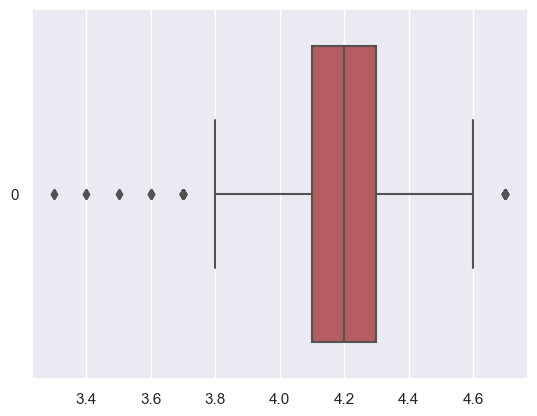

In [63]:
sb.boxplot(data=Cleaned['Stars'], orient = "h", color = 'r')

In [64]:
Cleaned["Stars"].describe()

count    922.000000
mean       4.185575
std        0.235729
min        3.300000
25%        4.100000
50%        4.200000
75%        4.300000
max        4.700000
Name: Stars, dtype: float64

In [65]:
#create a function to find outliers using IQR

def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [66]:
outliers = find_outliers_IQR(Cleaned["Stars"])
print("number of outliers for Stars: "+ str(len(outliers)))
print('\n')
# Number of null = 943-922 = 21 null values for Stars
print("number of NULL for Stars: 21")

number of outliers for Stars: 88


number of NULL for Stars: 21


We see that there are afew null and outliers in Stars which may affect the prediction model later

In [67]:
# Numeric Predictors
Cleaned[['Stars','Ram','Rom', 'Rear Camera', 'Front Camera', 'Price', 'Battery', 'ScreenSize']].describe()

,Stars,Ram,Rom,Rear Camera,Front Camera,Price,Battery,ScreenSize
count,922.000000,943.000000,943.000000,943.000000,943.000000,943.000000,943.000000,943.000000
mean,4.185575,3.438625,68.555938,27.291220,6.925769,223.320365,3553.969247,4.896543
std,0.235729,3.112900,69.838110,31.572795,8.645459,291.478165,1871.337150,2.190757
min,3.300000,0.000000,0.000000,0.000000,0.000000,11.904000,0.000000,0.000000
25%,4.100000,0.000000,0.000000,3.000000,0.000000,23.984000,1450.000000,2.400000
50%,4.200000,4.000000,64.000000,12.000000,5.000000,151.984000,4800.000000,6.440000
75%,4.300000,6.000000,128.000000,50.000000,12.000000,263.984000,5000.000000,6.600000
max,4.700000,12.000000,512.000000,200.000000,60.000000,2159.984000,7000.000000,7.000000


In [68]:
# Categorical Predictors
Cleaned[['Processor','Brand','Color','Expandable','DisplayType']].describe()

,Processor,Brand,Color,Expandable,DisplayType
count,943,943,943,943.0,943
unique,121,40,151,2.0,19
top,NA,itel,NA,1.0,Display
freq,339,120,170,584.0,245


Not much informations yet
- There are phones without length and battery data
- Ram, Rom Front camera have no lower outliers as the 25% is same as the min
- the processor and color have a very large amount of rows without data, therefore most likely unable to use for prediction
- Processor have 339 NA rows
- Color have 170 NA rows
- Intel is the brand with the highest amout of rows(120)
- There are 584 phones that support expandable memory
- There are 19 type of Display with 'Display' being the most commmon(245)


## Correlation stars vs all numerical predictor

In [69]:
correlation_matrix = Cleaned.corr()
correlation_matrix["Stars"]

Unnamed: 0     -0.210864
Stars           1.000000
Ram             0.474569
Rom             0.477503
Rear Camera     0.340169
Front Camera    0.383422
ScreenSize      0.549877
Price           0.494330
Battery         0.495736
Name: Stars, dtype: float64

## Correlation
Rear and Front camera have a weak positive correlation with stars
Ram, Rom, price, battery and screen size have a moderate positive coorellation

#### Time for some visualizations to check the distribution of the predictor variables, one by one, for both Numeric and Categorical predictors. However, we will not just do it sequentially as they appear in the dataset as columms. We will do based on what the variable describe. <br>
 -Memory: Ram, Rom, Expandable<br>
 -Camera: Rear, Front <br>
 -Display: ScreenSize, DisplayType <br>
 -Names: Names, Brand, Color <br>
 -Processor <br>
 -Battery <br>
 -Price <br>
 

### Predictor corresponding to Memory (Ram, Rom, Expandable)

<AxesSubplot:xlabel='Ram', ylabel='Count'>

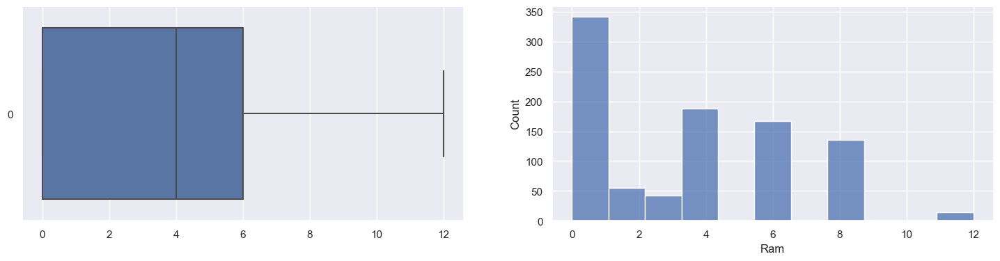

In [70]:
#Ram 
f, axes = plt.subplots(1, 2, figsize=(18, 4))
sb.boxplot(data = Cleaned['Ram'], orient = "h", ax = axes[0])
sb.histplot(data = Cleaned['Ram'], ax = axes[1])

- Data are generally skewed to the right, with no outliers <br>
- 0 have the highest count for RAM and 12 have the lowest count<br>
- from the histogram generally as ram increases the count decrease<br>

<AxesSubplot:xlabel='Rom', ylabel='Count'>

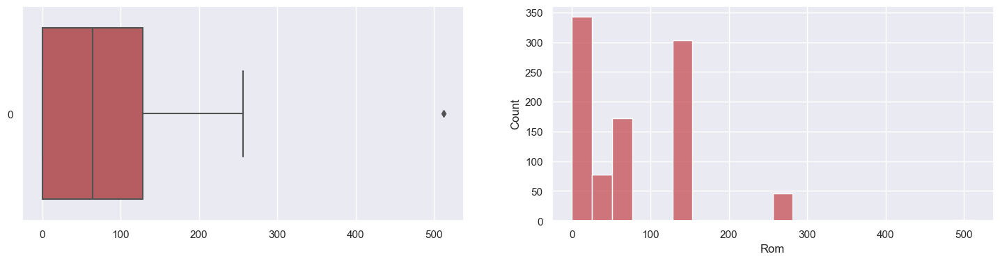

In [71]:
#Rom
f, axes = plt.subplots(1, 2, figsize=(18, 4))
sb.boxplot(data = Cleaned['Rom'], orient = "h", ax = axes[0], color = 'r')
sb.histplot(data = Cleaned['Rom'], ax = axes[1],color = 'r')

- There is outliears whose Rom are above 500GB <br>
- generally the Rom are around 0 to ~250GB <br>
- 0 have the highest count for ROM <br>
- unlikely to have phone without rom storage, might need to be replace with median or removed for a more accurate analysis<br>

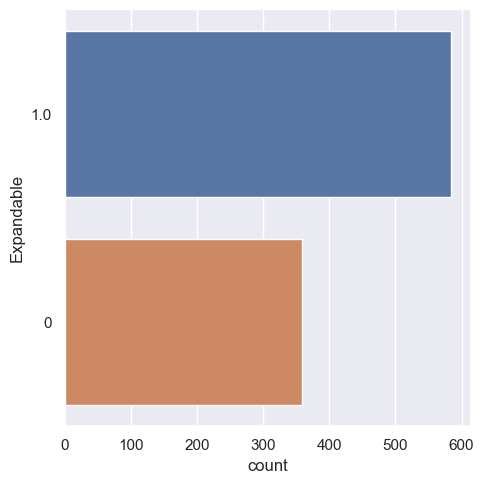

In [72]:
#expandable
sb.catplot(y = 'Expandable', data = Cleaned, kind = "count")

- Most phone supports expandable memory (1) <600
- <400 phone does not support expandable memory

### Predictor corresponding to Processor

<AxesSubplot:xlabel='Count', ylabel='Processor'>

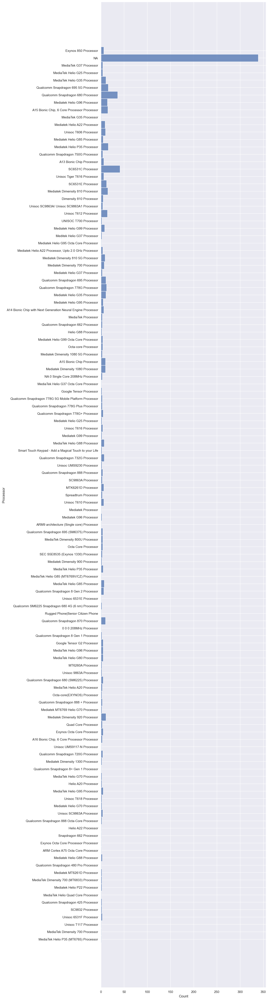

In [73]:
fig, ax = plt.subplots(figsize=(10, 60))

processor_counts = Cleaned["Processor"].value_counts()

# Get order based on count
processor_order = processor_counts.index.tolist()

# Create histogram with sorted order
#sb.barplot(, orient = 'h', y=Cleaned["Processor"], order =processor_order)
sb.histplot(data=Cleaned, y="Processor",bins=len(processor_order))


The mojority of the phone listed does not have their processor details, thus processor might not be the best predictor unless cleaning is done.
there are very scarce phones that uses the same processor

### Predictor corresponding to color

<AxesSubplot:xlabel='Count', ylabel='Color'>

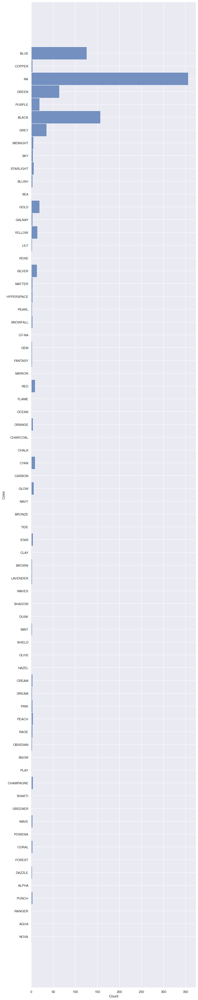

In [74]:
# Replace rows containing digits with NaN values
Cleaned['Color'] = Cleaned['Color'].replace(to_replace=r'\d+', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='X', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='XNA+', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='KNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='XNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='ENA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='TA-NA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='DS', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='GT-ENA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='RNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='WIFI', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='POWERNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='FLIP', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='KEYPAD', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='ULTRA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NEW', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='SUPER', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='JNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='ONYNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='FERRARI', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NA/NA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='TALKING', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NAN', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NAI', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NANA+', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='ANA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='YUVA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='POWER', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace="PRODUCT\)RED", value='RED', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='PRO', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='PLUS', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='KUNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='POWNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='GULNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='SNA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='RAFALE', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NAA+', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NAA', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='NA\+', value='NA', regex=True)
Cleaned['Color'] = Cleaned['Color'].replace(to_replace='MNA', value='NA', regex=True)
Cleaned['Color'].unique()


#plot
fig, ax = plt.subplots(figsize=(10, 60))
sb.histplot(y = 'Color', data = Cleaned, ax=ax)


-A large number of phones do not have a declared color <br>
- other than NA the next highest is black <br>
- there are too many color that might be too similar eg. blue&sea, copper&gold but we can just decide that they are the same color <br>

### Predictor corresponding to Camera(Front, Rear)

<AxesSubplot:xlabel='Rear Camera', ylabel='Count'>

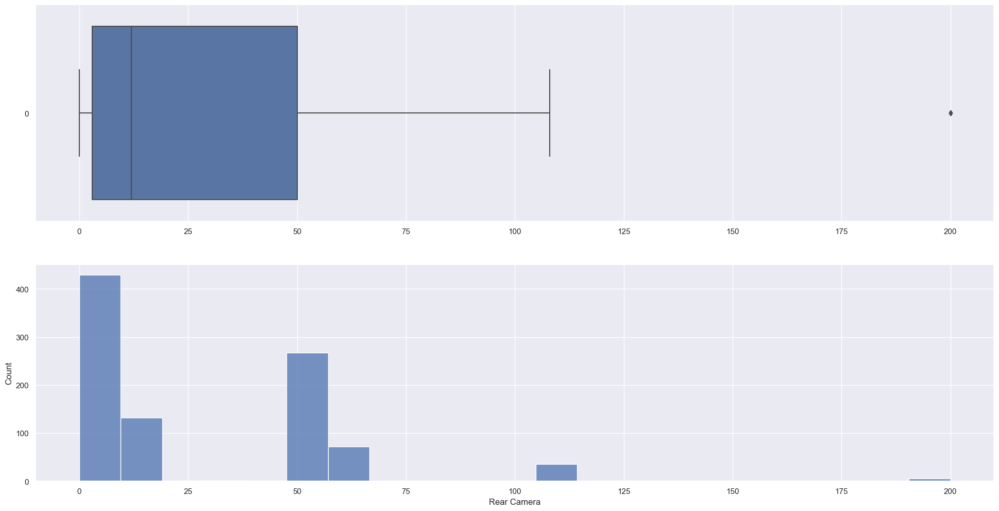

In [75]:
#rear Camera
# Set up matplotlib figure with two subplots
f, axes = plt.subplots(2, 1, figsize=(24, 12))

sb.boxplot(data=Cleaned["Rear Camera"], orient="h", ax=axes[0])
sb.histplot(data=Cleaned["Rear Camera"], ax=axes[1])

<AxesSubplot:xlabel='Front Camera', ylabel='Count'>

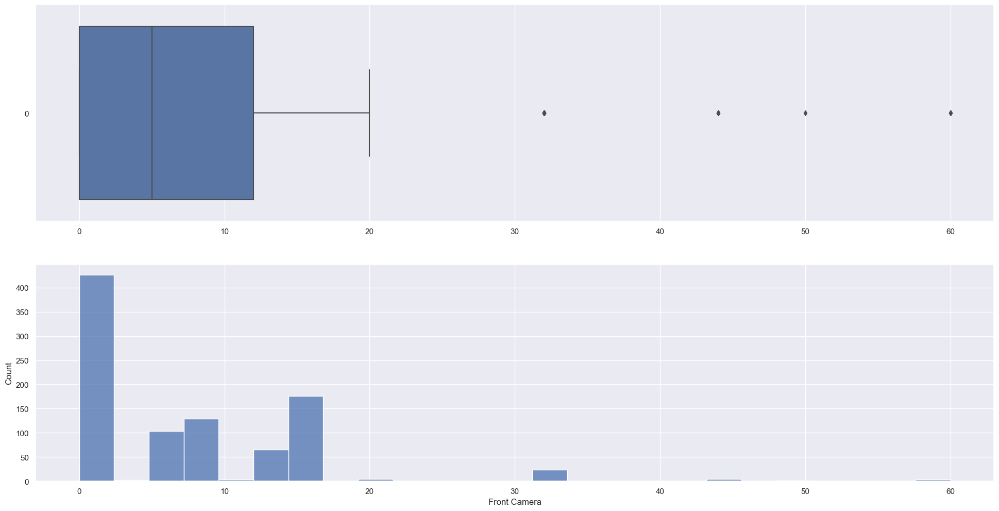

In [76]:
#Front Camera
# Set up matplotlib figure with two subplots
f, axes = plt.subplots(2, 1, figsize=(24, 12))

sb.boxplot(data=Cleaned["Front Camera"], orient="h", ax=axes[0])
sb.histplot(data=Cleaned["Front Camera"], ax=axes[1])

### Predictor corresponding to Screen(ScreenSize, ScreenType)

<AxesSubplot:xlabel='ScreenSize', ylabel='Count'>

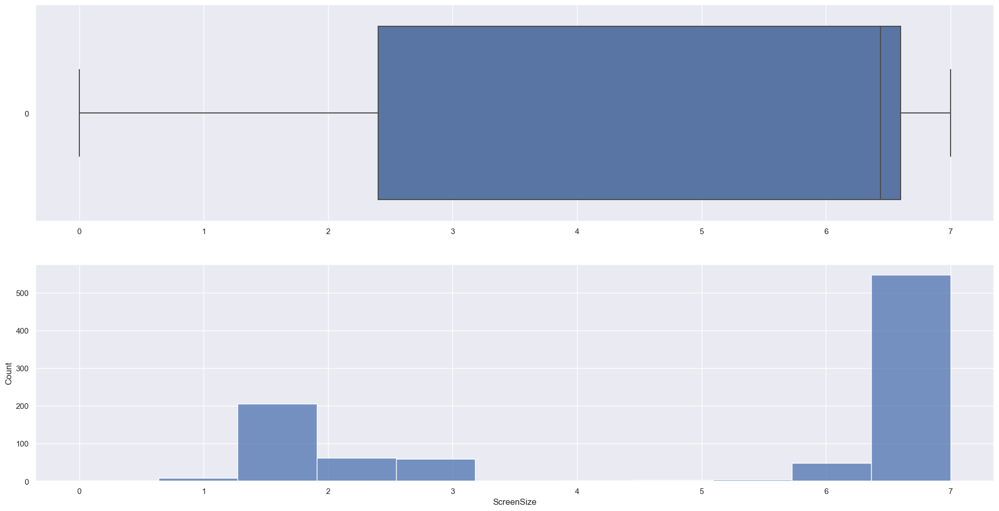

In [77]:
#screen Size
# Set up matplotlib figure with two subplots

f, axes = plt.subplots(2, 1, figsize=(24, 12))

sb.boxplot(data=Cleaned["ScreenSize"], orient="h", ax=axes[0])
sb.histplot(data=Cleaned["ScreenSize"], ax=axes[1])

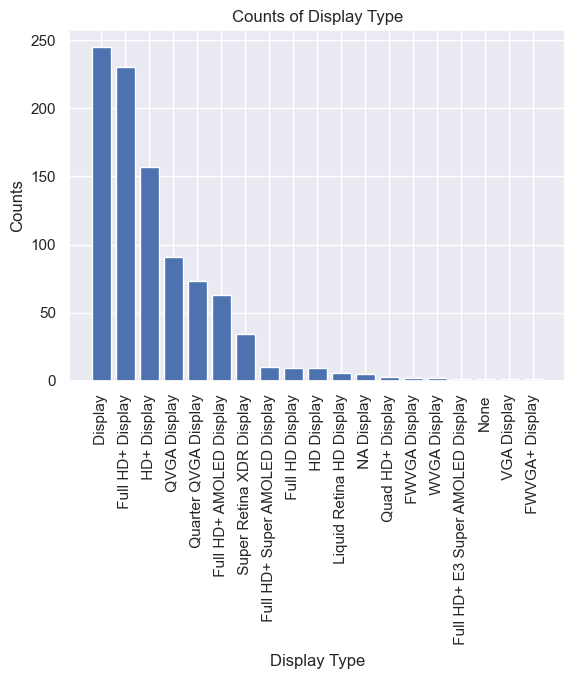

In [78]:
#screenType
# get the counts of unique values in the "DisplayType" column
counts = Cleaned['DisplayType'].value_counts()

# create a bar chart
plt.bar(counts.index, counts)

# set the title and axis labels
plt.title("Counts of Display Type")
plt.xlabel("Display Type")
plt.ylabel("Counts")

# adjust the margins and rotate the x-axis labels
plt.subplots_adjust(bottom=0.15)
plt.xticks(rotation=90)

# show the plot
plt.show()

### Predictor corresponding to Brand

<AxesSubplot:xlabel='Count', ylabel='Brand'>

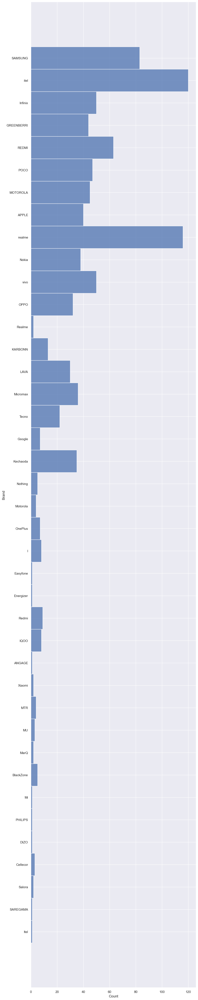

In [79]:
#plot
fig, ax = plt.subplots(figsize=(10, 60))
sb.histplot(y = 'Brand', data = Cleaned, ax=ax)

### Predictor corresponding to Battery

<AxesSubplot:>

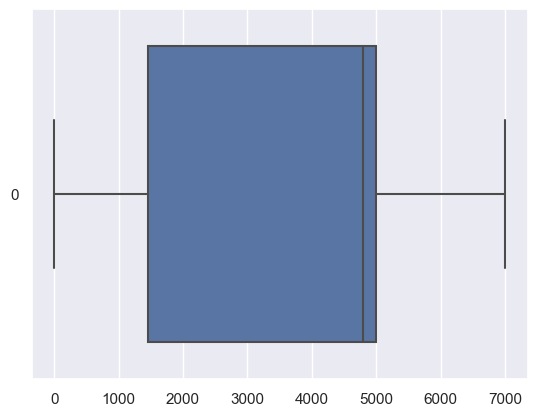

In [80]:
#Battery exploratory analysis

sb.boxplot(data=Cleaned['Battery'], orient = "h", color = 'b')

### Predictor corresponding to Price

<AxesSubplot:>

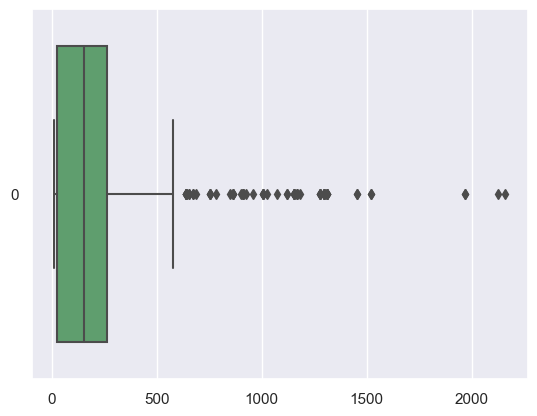

In [81]:
#Price exploratory analysis

#Box plot for price
sb.boxplot(data=Cleaned['Price'], orient = "h", color = 'g')

# Relationship with Rating

## Stars with Ram, Rom, Expandable, Processor, Color

Correlation:  0.4745694857863057


<Figure size 1600x800 with 0 Axes>

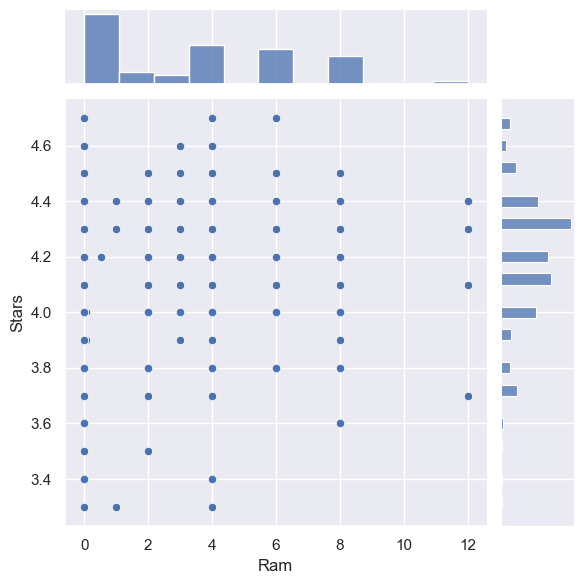

In [82]:
#RAM

f = plt.figure(figsize=(16, 8))
correlation = Cleaned['Ram'].corr(Cleaned['Stars'])

print('Correlation: ',correlation)
sb.jointplot(x = 'Ram', y = 'Stars', data = Cleaned)
plt.show()

### Ram with stars
- from the scatter plot there is no obvious relationship <br>
- the corelation is 0.474 which have a weak positive correlation <br>
- Ram might be a potential predictor for stars <br>

Correlation:  0.47750271813509204


<Figure size 1600x800 with 0 Axes>

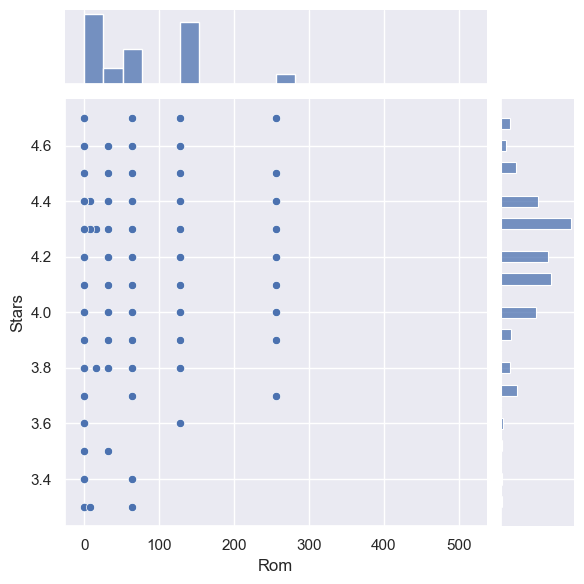

In [83]:
#ROM

f = plt.figure(figsize=(16, 8))
correlation = Cleaned['Rom'].corr(Cleaned['Stars'])

print('Correlation: ',correlation)
sb.jointplot(x = 'Rom', y = 'Stars', data = Cleaned)
plt.show()

### Rom with stars
- from the scatter plot there is no obvious relationship <br>
- the corelation is 0.477 which have a weak positive correlation <br>
- Rom might be a potential predictor for stars <br>

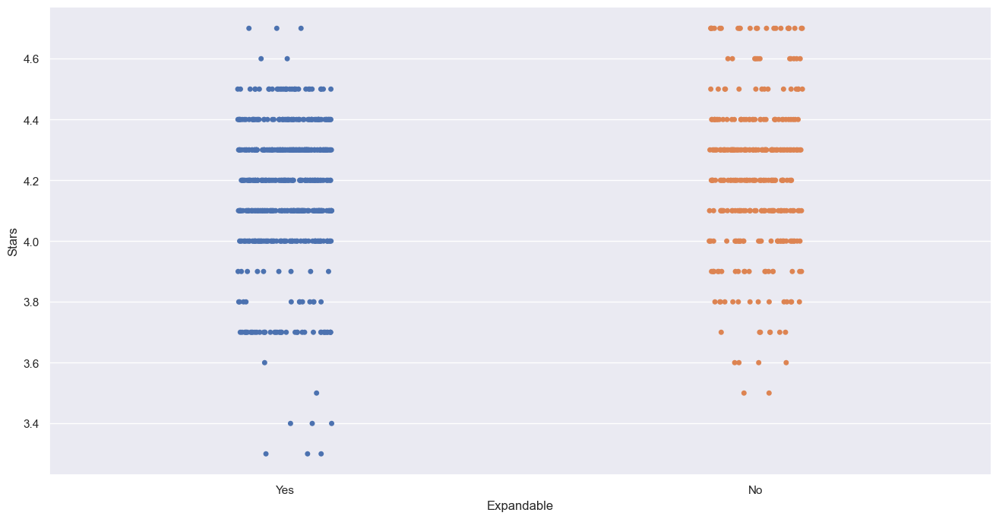

In [84]:
#expandable vs Stars

Cleaned['Expandable'] = Cleaned['Expandable'].replace(to_replace=1, value='Yes', regex=True)
Cleaned['Expandable'] = Cleaned['Expandable'].replace(to_replace='0', value='No', regex=True)

f = plt.figure(figsize=(16, 8))
sb.stripplot(x = 'Expandable', y = 'Stars', data = Cleaned)
plt.show()

### Expandable with stars
- from the scatter plot there is no obvious relationship <br>
- how ever phone with expandable memory have ratings that are 3.4 & below
- Phones without expandable memomry seems to have more datapoint for stars above 4.6 <br>
- Expandable memory might be a good predictor <br>

<AxesSubplot:xlabel='Stars', ylabel='Processor'>

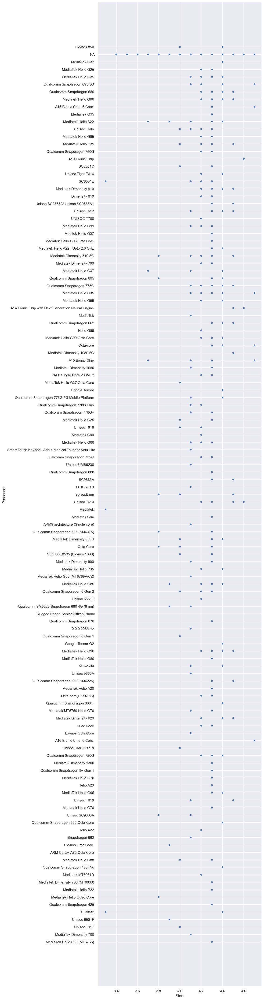

In [85]:
#Processor

Cleaned['Processor'] = Cleaned['Processor'].str.replace('Processor', '')

fig, ax2 = plt.subplots(figsize=(10, 60))

# adjust the spacing between the subplots
plt.subplots_adjust(top=0.9, right=0.9, left=0.2, bottom=0.2)
sb.scatterplot(x = 'Stars', y = 'Processor', data = Cleaned,ax=ax2)


### Processor with stars

- There is no obvious relationship <br>
- NA seems to have the Stars of all values
- SC9832 have the lowest stars

<AxesSubplot:xlabel='Stars', ylabel='Color'>

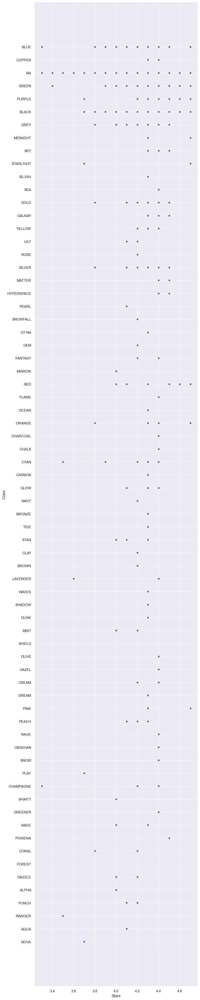

In [86]:
#Color

fig, ax2 = plt.subplots(figsize=(10, 60))

# adjust the spacing between the subplots
plt.subplots_adjust(top=0.9, right=0.9, left=0.2, bottom=0.2)
sb.scatterplot(x = 'Stars', y = 'Color', data = Cleaned,ax=ax2)

### Color with Stars
- NA have data for all values of stars
- copper have quite a high stars
- midnight have a high Stars
- The lowest stars is from champagne color
- although black is the highest color aside from NA, the ratings are generally above 3.7

## Stars with Rear Camera, Front Camera, ScreenSize, ScreenType

### Rear Camera with Stars
Generally the corelation is positive, which means when MP of rear camera increase, the value of Stars increase. However the corelation is too weak (<0.5) so Rear Camera may not be a good variable to determine Stars.

In [87]:
# Create a joint dataframe by concatenating the two variables
jointDF = pd.concat([Cleaned["Rear Camera"], Cleaned['Stars']], axis=1).reindex(Cleaned["Rear Camera"].index)
jointDF


,Rear Camera,Stars
0,50.0,4.4
1,50.0,4.4
2,0.0,4.1
3,50.0,4.4
4,50.0,4.4
...,...,...
1138,64.0,4.0
1139,13.0,4.3
1140,8.0,4.1
1141,3.0,4.6


0.34016946680243615


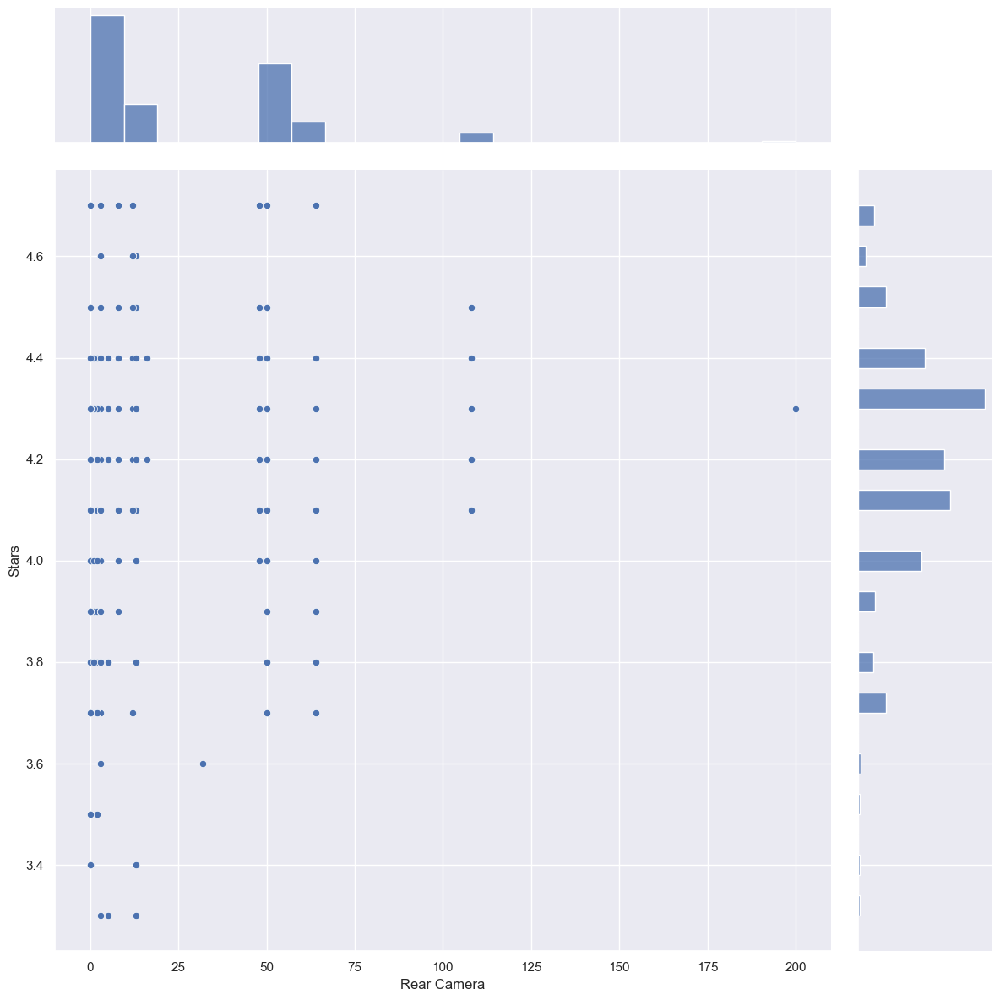

In [88]:
corr1 = Cleaned["Rear Camera"].corr(Cleaned["Stars"])

print(corr1)

# Draw jointplot of rear camera VS Stars in the joined dataframe
sb.jointplot(data=jointDF, x="Rear Camera", y="Stars", height=12)

### Front Camera with Stars
Generally the corelation is positive, which means when MP of rear camera increase, the value of Stars increase. However the corelation is too weak (<0.5) so Rear Camera may not be a good variable to determine Stars.

In [89]:
# Create a joint dataframe by concatenating the two variables
jointDF2 = pd.concat([Cleaned["Front Camera"], Cleaned['Stars']], axis=1).reindex(Cleaned["Rear Camera"].index)
jointDF2

,Front Camera,Stars
0,8.0,4.4
1,8.0,4.4
2,0.0,4.1
3,8.0,4.4
4,8.0,4.4
...,...,...
1138,44.0,4.0
1139,0.0,4.3
1140,0.0,4.1
1141,0.0,4.6


0.3834221549452544


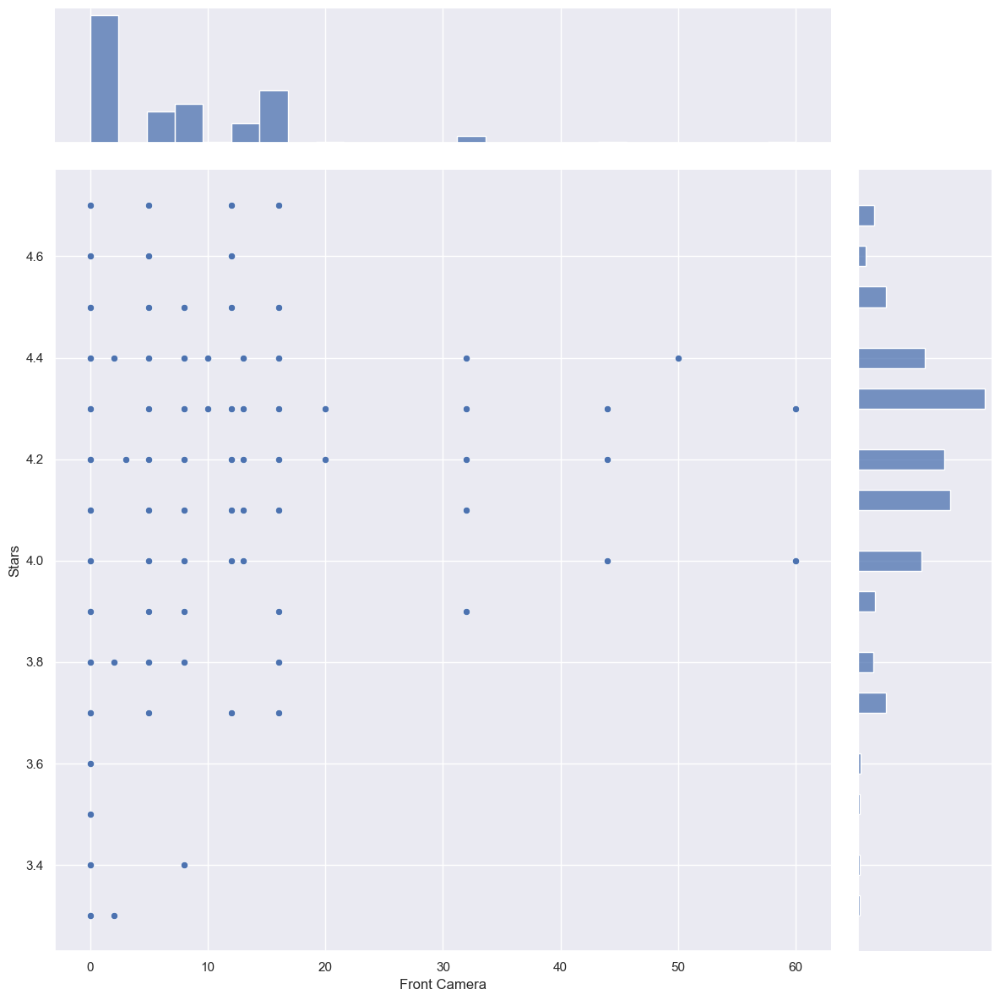

In [90]:
#print the correlationship
corr2 = Cleaned["Front Camera"].corr(Cleaned["Stars"])

print(corr2)

# Draw jointplot of Front camera VS Stars in the joined dataframe
sb.jointplot(data=jointDF2, x="Front Camera", y="Stars", height=12)

### ScreenSize with Stars

In [91]:
# Create a joint dataframe by concatenating the two variables
jointDF3 = pd.concat([Cleaned["ScreenSize"], Cleaned['Stars']], axis=1).reindex(Cleaned["Rear Camera"].index)
jointDF3

,ScreenSize,Stars
0,6.60,4.4
1,6.60,4.4
2,1.80,4.1
3,6.60,4.4
4,6.60,4.4
...,...,...
1138,6.44,4.0
1139,6.08,4.3
1140,6.56,4.1
1141,2.40,4.6


0.5498768072960432


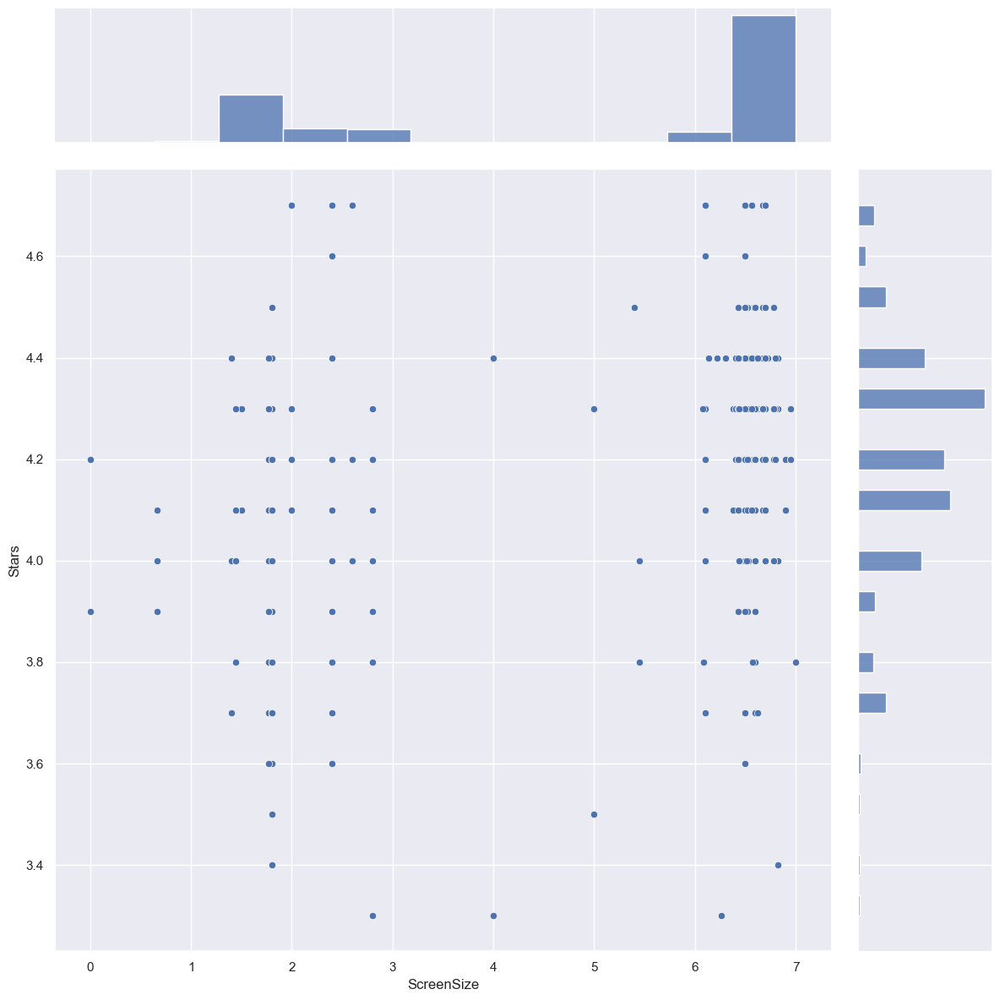

In [92]:
corr3 = Cleaned["ScreenSize"].corr(Cleaned["Stars"])

print(corr3)
# Draw jointplot of screensize vs stars 
sb.jointplot(data=jointDF3, x="ScreenSize", y="Stars", height=12)

The corelation is positive, which means when MP of front camera increase, the value of Stars increase. The corelation is abit weak as it is near 0.5. Possible factor in determining value of stars.

### DisplayType with Stars

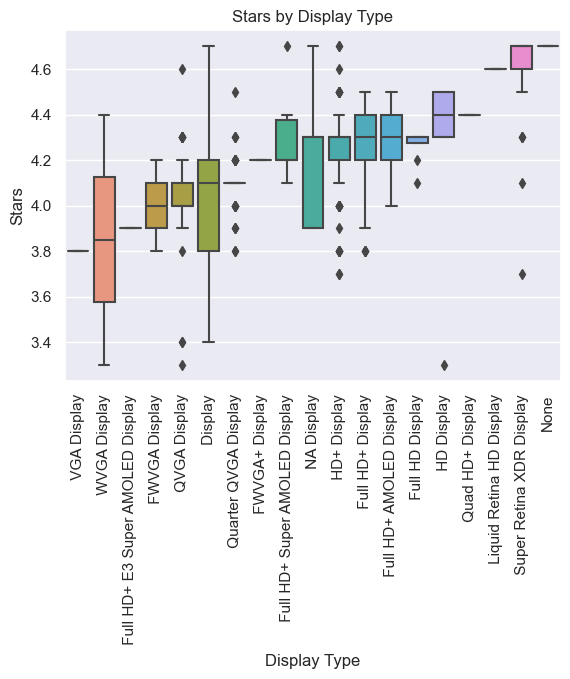

In [93]:
# box plot of Display Type according to their category
# Sort the data by the median value of Stars for each DisplayType
medians = Cleaned.groupby(['DisplayType'])['Stars'].median().sort_values()
Cleaned_sorted = Cleaned[Cleaned['DisplayType'].isin(medians.index)]

# Create a box plot with DisplayType on the x-axis and Stars on the y-axis
sb.boxplot(x="DisplayType", y="Stars", data=Cleaned_sorted, order=medians.index)

# Set the title and axis labels
plt.title("Stars by Display Type")
plt.xlabel("Display Type")
plt.ylabel("Stars")

# adjust the margins and rotate the x-axis labels
plt.subplots_adjust(bottom=0.15)
plt.xticks(rotation=90)

# Show the plot
plt.show()

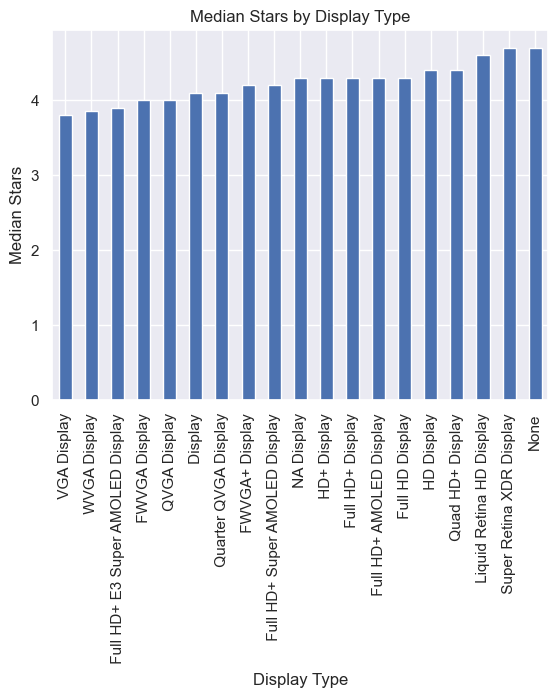

In [94]:
#plot median stars vs Display Type
# Calculate the median Stars value for each DisplayType and sort in ascending order
medians = Cleaned.groupby(['DisplayType'])['Stars'].median().sort_values(ascending=True)

# Plot the median values as a bar chart
ax = medians.plot(kind='bar')

# Set the title and axis labels
plt.title("Median Stars by Display Type")
plt.xlabel("Display Type")
plt.ylabel("Median Stars")

# Rotate the x-axis labels for readability
plt.xticks(rotation=90)

# Show the plot
plt.show()

## Stars with Brand, Battery, Price

### Battery with Stars

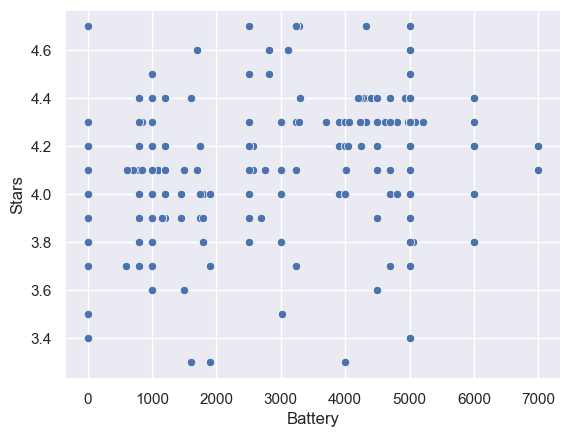

In [95]:
#Scatter plot for battery against stars

# Create the scatter plot
sb.scatterplot(x='Battery', y='Stars', data=Cleaned)

# Display the plot
plt.show()

### Battery with Stars analysis
As for the boxplot, it shows that the median value for battery as shown by the center line is very much to the right. This indicates that the battery data is heavily skewed to the right with the median being about 4800 mah. This suggests that smartphones in our data sample happens to have much higher battery capacity than normal.

As for the scatterplot for battery against stars, the heavy scatter of the points all over the graph clearly suggests that there is no clear strong relationship between battery and how users of the smartphones rate them. The circular nature of the data points is indicating that the relationship between battery and star rating is extremely weak and thus no strong conclusion can be made on how much a smartphone is valued by customers just based on its battery capacity alone. 

Thus we can safely conclude that potential buyers of smartphones do not generally value the battery capacity of their smartphones or if at all.

### Brand with Stars

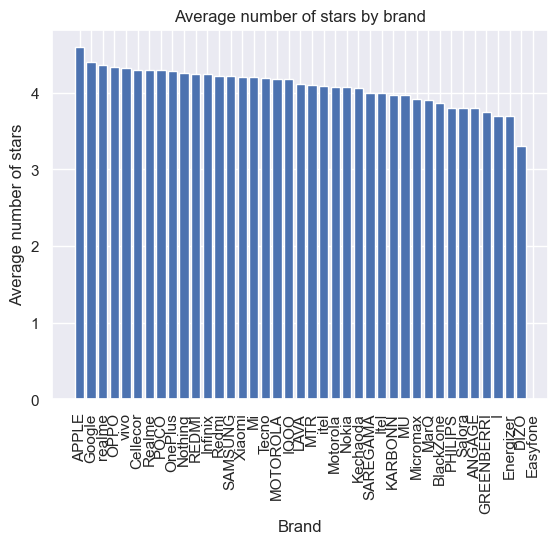

In [96]:
#Brand exploratory analysis

# Group by brand
grouped_df = Cleaned.groupby('Brand')['Stars'].mean().reset_index()

#Sort the data frame in a descending order
df_sorted = grouped_df.sort_values('Stars', ascending=False)

# Create the bar chart
plt.bar(df_sorted['Brand'], df_sorted['Stars'])

# Add axis labels and title
plt.xlabel('Brand')
plt.ylabel('Average number of stars')
plt.title('Average number of stars by brand')

#Rotate brand names
plt.xticks(rotation=90)

# Display the plot
plt.show()

In [97]:
px.scatter(x=Cleaned['Brand'],y=Cleaned['Stars'],color=Cleaned['Brand'],width=800, height=800,title="Mobile Brands and Stars")

### Brand with Stars analysis
As shown by the bar chart above, Apple has the highest average rating among the entire list of brands while the brand with the lowest average star rating was DIZO.

In general, we can conclude the more wellknown and established brands such as Apple, Google and Oppo are much more likely to be rated higher by customers compared to brands that are less established by the public.

### Price with Stars

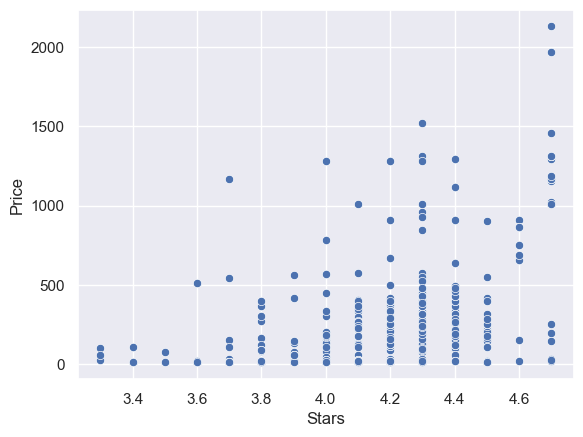

In [98]:
#Scatter plot for battery against stars

# Create the scatter plot
sb.scatterplot(x='Stars', y='Price', data=Cleaned)

# Display the plot
plt.show()

### Price with Stars analysis
As for the boxplot for price, there are way too many outliers past the 1.5 of IQR while the right tail of the boxplot being much longer than that of the left tail. This means that the majority of the price data is concentrated towards the left of the box, and there are relatively few data points with high values that are pulling the right whisker out to a longer length. This shows that prices of the smartphones ranges extremely from a very low price to a very high one.

As for the scatter plot for price against star rating, it is generally observed that there are much more cheaper phones with a star rating above 4.0. It is also observed that the higher the price of a smartphone, it is much likely for it to be rated very highly.

What we can conclude is that, users generally prefer lower priced phones and most of them are generally liked by them however when the smartphones are cheaper, it is relativley more likely to be rated below 4.0 compared to smartphones that are priced much higher.

## Complex Relationships with Stars
- Used some of the highest coorelations we have 

### Ram&Rom Vs Stars

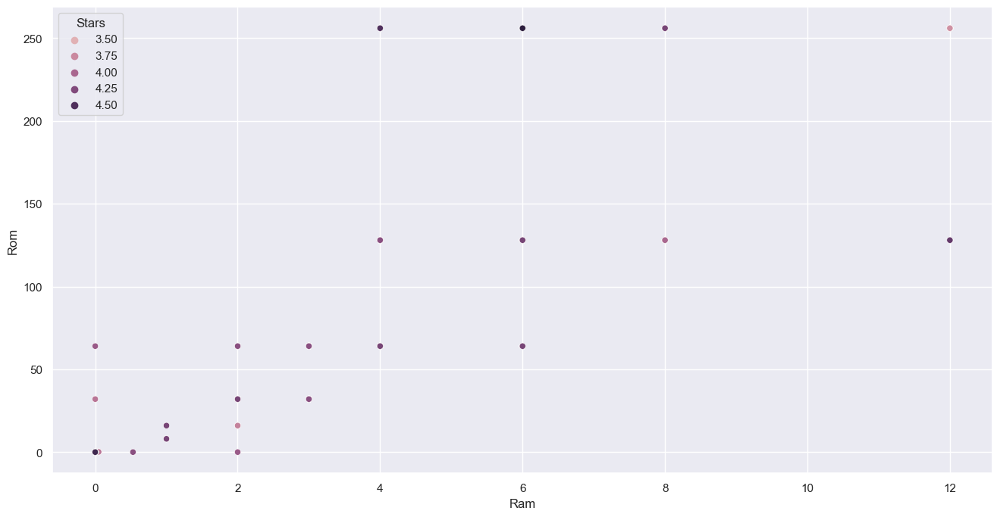

In [99]:


f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'Ram', y = 'Rom', hue = 'Stars', data = Cleaned)
plt.show()

-Generally as rom increase, ram increase. however there doesnt seem to have a relation between stars

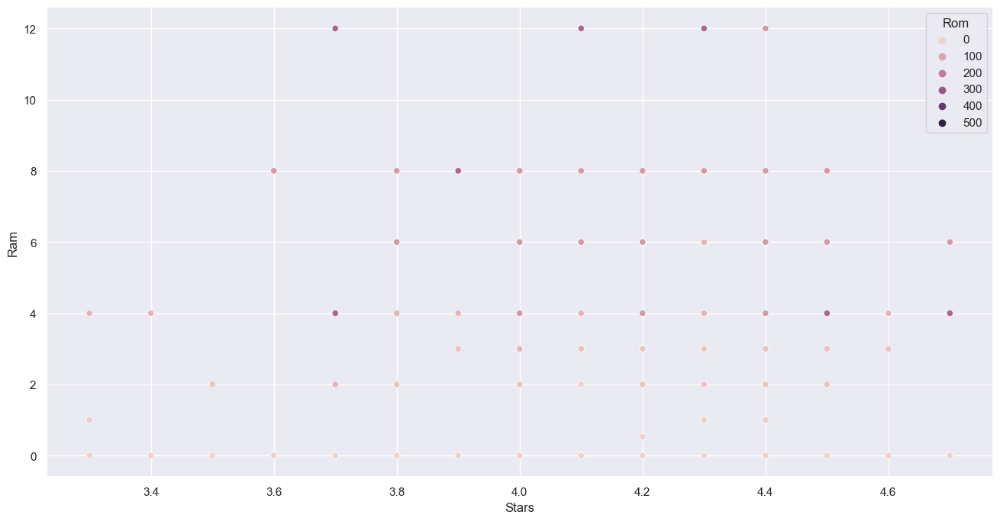

In [100]:
#switching the plots
f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'Stars', y = 'Ram', hue = 'Rom', data = Cleaned)
plt.show()

Still no obvious relation of the stars and ram/rom

### ScreenSize&Battery Vs Stars

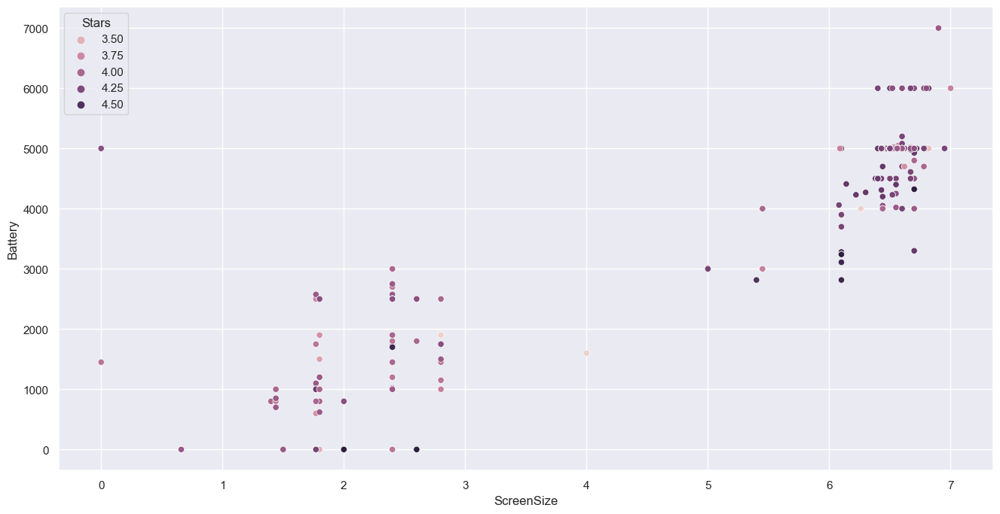

In [101]:
#switching the plots
f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'ScreenSize', y = 'Battery', hue = 'Stars', data = Cleaned)
plt.show()

- generally as battery and screenSize increases, The shade of the stars also darken depicting higher stars <br>
- they are good predictors for stars

### Price&Rom Vs Stars

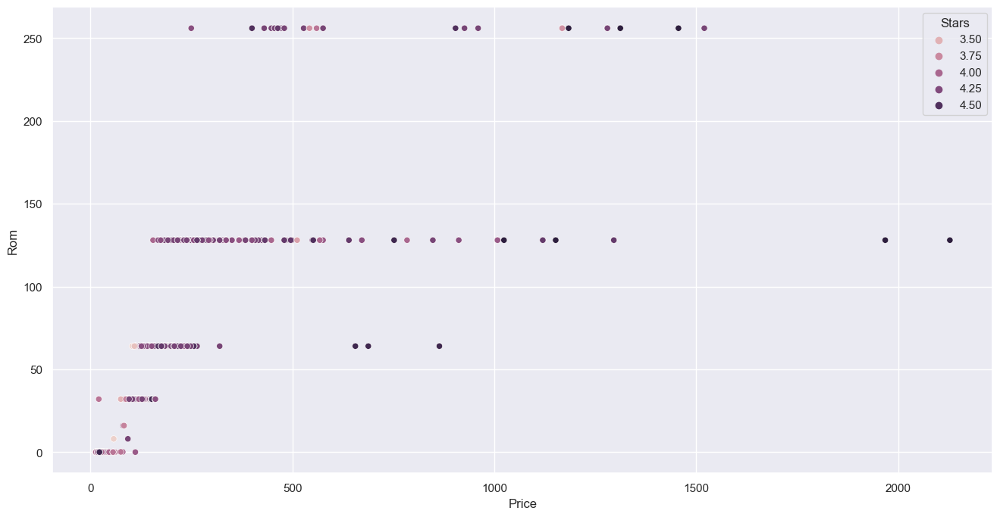

In [102]:
#switching the plots
f = plt.figure(figsize=(16, 8))
sb.scatterplot(x = 'Price', y = 'Rom', hue = 'Stars', data = Cleaned)
plt.show()

- generally the higher priced for each rom size  have higher stars
- they might be good predictors for stars

.

.

# Model Selection & attempts
##### ****REMEMBER TO DUPLICATE THE CLEANED DATAFRAME FOR UR MODEL. DO NOT USE CLEANED

# Section 4: Model 2, Linear and Polynomial Regression
done by Mak Chee Cheng <br>
Model Regression

In [120]:
correlation_matrix = Cleaned.corr()
correlation_matrix["Stars"]

Unnamed: 0     -0.210864
Stars           1.000000
Ram             0.474569
Rom             0.477503
Rear Camera     0.340169
Front Camera    0.383422
ScreenSize      0.549877
Price           0.494330
Battery         0.495736
Name: Stars, dtype: float64

## Why Regression?
Regression is suitable model as all the variable have positive correlation with stars. This means as the variable increase stars also increases. Regression model is one the most straight forward methods.

#### Replacing Nan values in Stars
As there is some NaN values in Stars it is necessary to replace it with some values. Median is chosen to not negatively affect the results. 

In [105]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from statistics import mean, median, mode, stdev
Linear = Cleaned.copy()
#replace NaN in stars with median
print("Median of Stars:",median(Cleaned["Stars"]))
print("percentage of NaN in Stars: ", (943-922)/943*100, "%")
print()
Linear["Stars"].fillna(median(Linear["Stars"]), inplace=True)
#print(Linear['Stars'])
Linear.info()

Median of Stars: 3.9
percentage of NaN in Stars:  2.2269353128313893 %

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 0 to 1142
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    943 non-null    int64  
 1   Names         943 non-null    object 
 2   Stars         943 non-null    float64
 3   Processor     943 non-null    object 
 4   Brand         943 non-null    object 
 5   Color         943 non-null    object 
 6   Ram           943 non-null    float64
 7   Rom           943 non-null    float64
 8   Expandable    943 non-null    object 
 9   Rear Camera   943 non-null    float64
 10  Front Camera  943 non-null    float64
 11  ScreenSize    943 non-null    float64
 12  DisplayType   943 non-null    object 
 13  Price         943 non-null    float64
 14  Battery       943 non-null    float64
dtypes: float64(8), int64(1), object(6)
memory usage: 150.2+ KB


##### Since only 2% is null we can replace the data with median

### Univariate Regression

Take the 5 highest correlation, to do univariate regression. screensize, rom , ram , battery & price. 4 Attempts are tested for each variable. 
- Attempt 1: Linear Regression for each variable
- Attempt 2: Polynomial Regression for each variable
- Attempt 3 : Linear Regression with outliers removed for each variable
- Attempt 4: Polynomial Regression with outliers removed for each variable


### Attempt 1: Linear Regression Stars against ScreenSize

In [104]:
# Linear regression of Stars against ScreenSize
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear['Stars'])   # Response
SS= pd.DataFrame(Linear['ScreenSize'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(SS, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (754, 1) (754, 1)
Test Set  : (189, 1) (189, 1)


Intercept of Regression 	: b =  [3.8836058]
Coefficients of Regression 	: a =  [[0.06134288]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.31933165189620694
Mean Squared Error (MSE) 	: 0.03834475833749644

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.10179997642308691
Mean Squared Error (MSE) 	: 0.048913316476672734



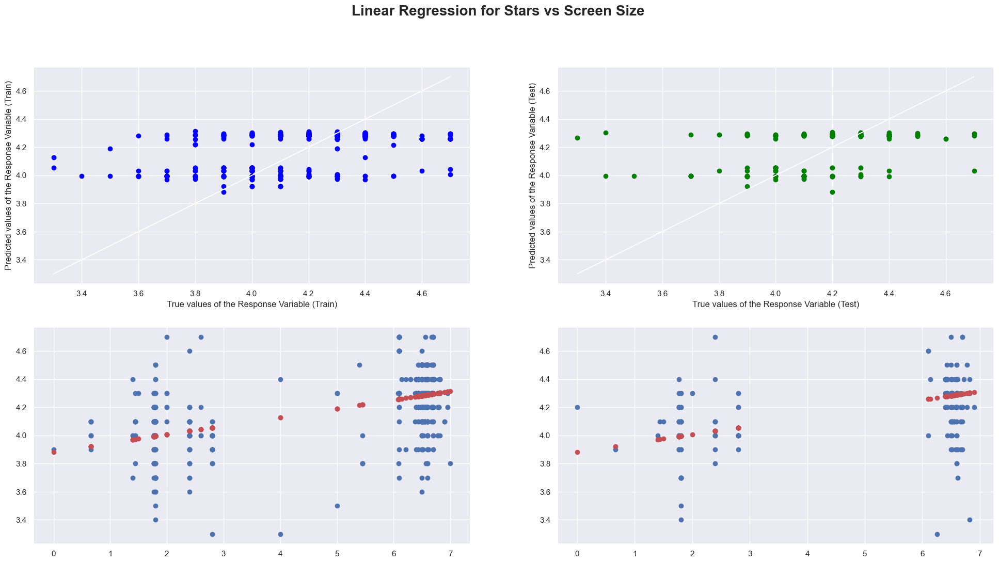

In [123]:
# Linear Regression using Train Data : Stars against ScreenSize
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))

# Set the title of the plot
plt.suptitle("Linear Regression for Stars vs Screen Size", fontsize=20, fontweight='bold')

axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 2: Polynomial Regression Stars against ScreenSize

Intercept of Regression 	: b =  [3.94516721]
Coefficients of Regression 	: a =  [[0.         0.01978859 0.00493496]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3203876561071426
Mean Squared Error (MSE) 	: 0.03828526941549131

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.09930844678620487
Mean Squared Error (MSE) 	: 0.04904899781094225



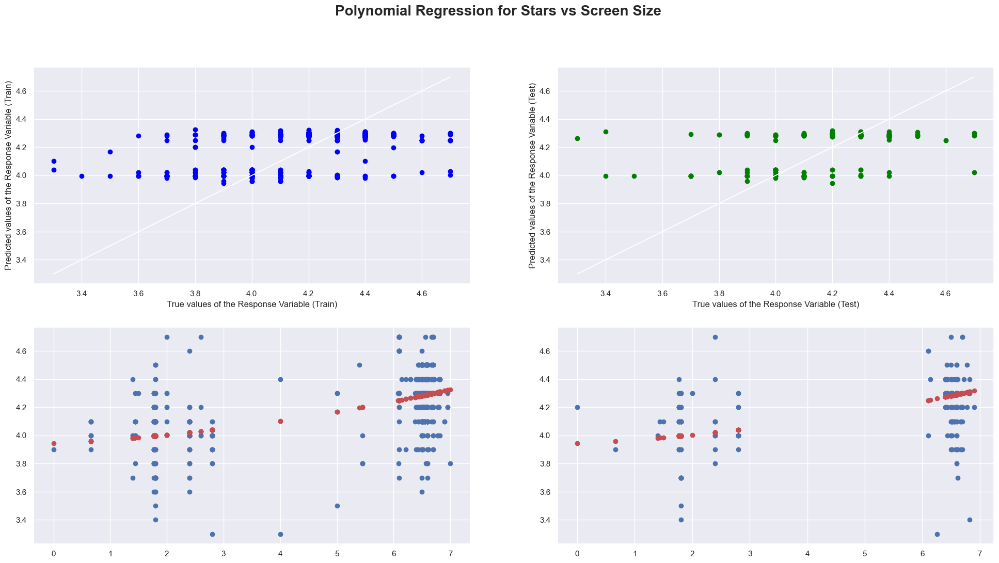

In [124]:
#create polynomial regression 
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Screen Size", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


#### Removing outliers for both Stars & Screen Size

<AxesSubplot:>

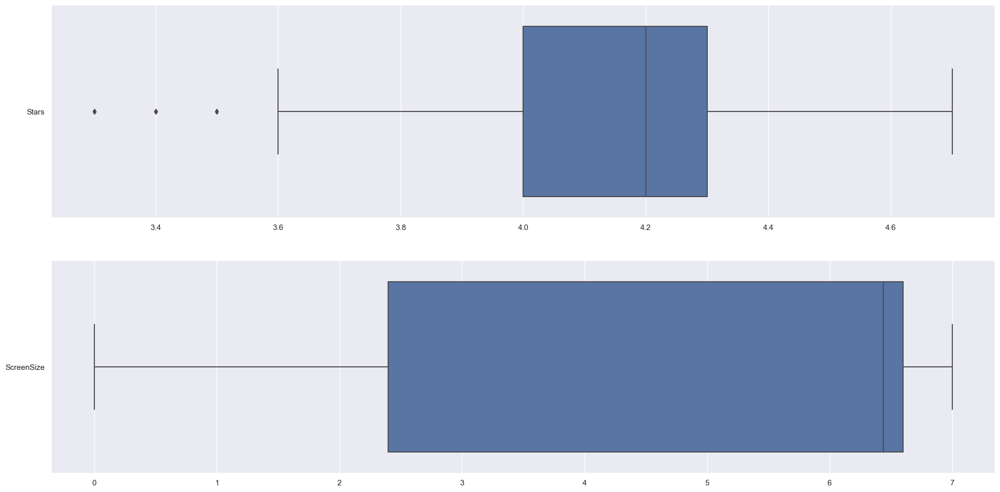

In [125]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = S, orient = "h", ax = axes[0])
sb.boxplot(data = SS, orient = "h", ax = axes[1])

In [126]:
Linear['Stars'].unique() # below 3.6 is outlier

array([4.4, 4.1, 3.7, 4.3, 4.7, 4.2, 3.9, 4.5, 4.6, 4. , 3.8, 3.3, 3.4,
       3.6, 3.5])

In [105]:
#create copy of a dataframe to remove outlier
Linear1 = Linear.copy()


In [106]:
# drop rows based on their values
Linear1 = Linear1.drop(Linear1[(Linear1['Stars'] < 3.6)].index)
print(Linear1['Stars'].unique())


[4.4 4.1 3.7 4.3 4.7 4.2 3.9 4.5 4.6 4.  3.8 3.6]


In [129]:
# Linear regression of Stars against ScreenSize
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear1['Stars'])   # Response
SS= pd.DataFrame(Linear1['ScreenSize'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(SS, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (747, 1) (747, 1)
Test Set  : (187, 1) (187, 1)


### Attempt 3: Linear Regression  Stars against ScreenSize after removing outliers

Intercept of Regression 	: b =  [3.93015122]
Coefficients of Regression 	: a =  [[0.05214711]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.26094451094874993
Mean Squared Error (MSE) 	: 0.0368336400994604

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.4140030805077928
Mean Squared Error (MSE) 	: 0.03147045940312778



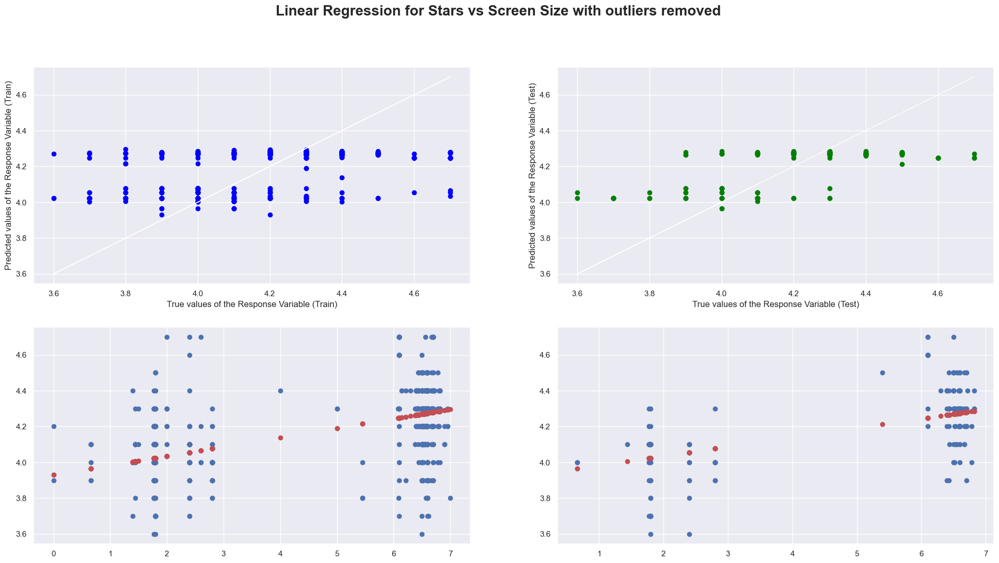

In [130]:
# Linear Regression using Train Data : Stars against ScreenSize after removing outlirs
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Screen Size with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 4: Polynomial Regression  Stars against ScreenSize after removing outliers

Intercept of Regression 	: b =  [3.94563367]
Coefficients of Regression 	: a =  [[0.         0.04170127 0.00123982]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.2610244304052446
Mean Squared Error (MSE) 	: 0.036829657009501554

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.4131736150000693
Mean Squared Error (MSE) 	: 0.03151500513317995



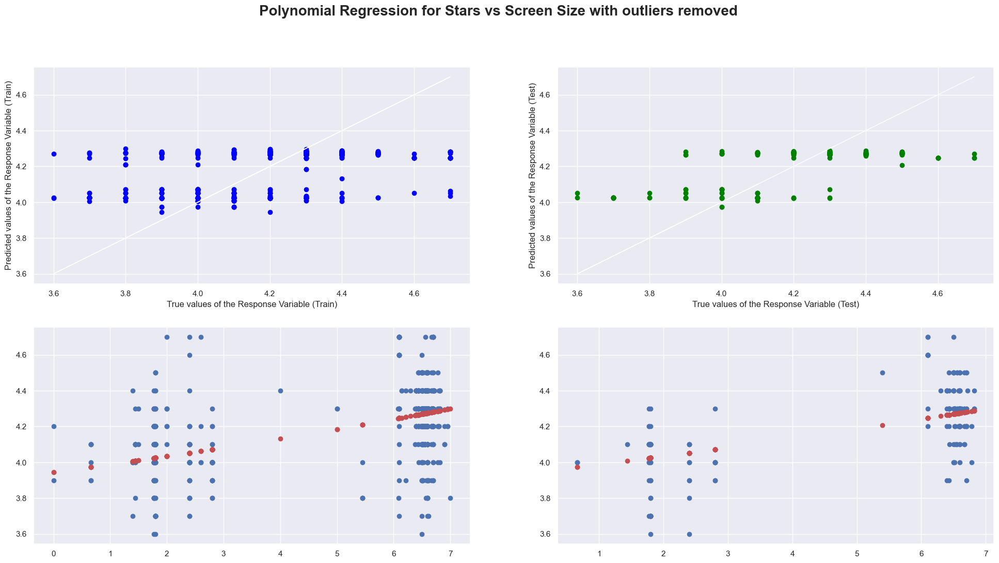

In [131]:
#create polynomial regression Stars vs ScreenSize
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Screen Size with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 1: Linear Regression  Stars against Rom

In [132]:
# Linear regression of Stars against Rom
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear['Stars'])   # Response
rom= pd.DataFrame(Linear['Rom'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(rom, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (754, 1) (754, 1)
Test Set  : (189, 1) (189, 1)


Intercept of Regression 	: b =  [4.0862807]
Coefficients of Regression 	: a =  [[0.0013891]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.16876680200454264
Mean Squared Error (MSE) 	: 0.04802455372059661

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.20981852759539354
Mean Squared Error (MSE) 	: 0.03865808173189



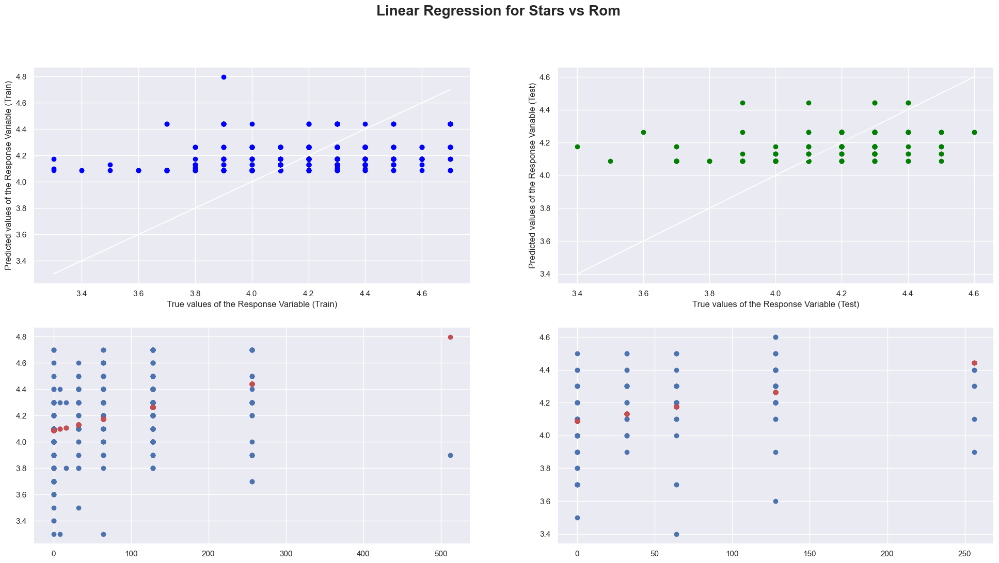

In [133]:
# Linear Regression using Train Data : Stars against Rom
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values

f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Rom", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 2: Polynomial Regression  Stars against Rom

Intercept of Regression 	: b =  [4.0412229]
Coefficients of Regression 	: a =  [[ 0.00000000e+00  3.26216068e-03 -8.60270231e-06]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.25901081763666134
Mean Squared Error (MSE) 	: 0.04281069966960534

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2736626346070964
Mean Squared Error (MSE) 	: 0.0355346337732239



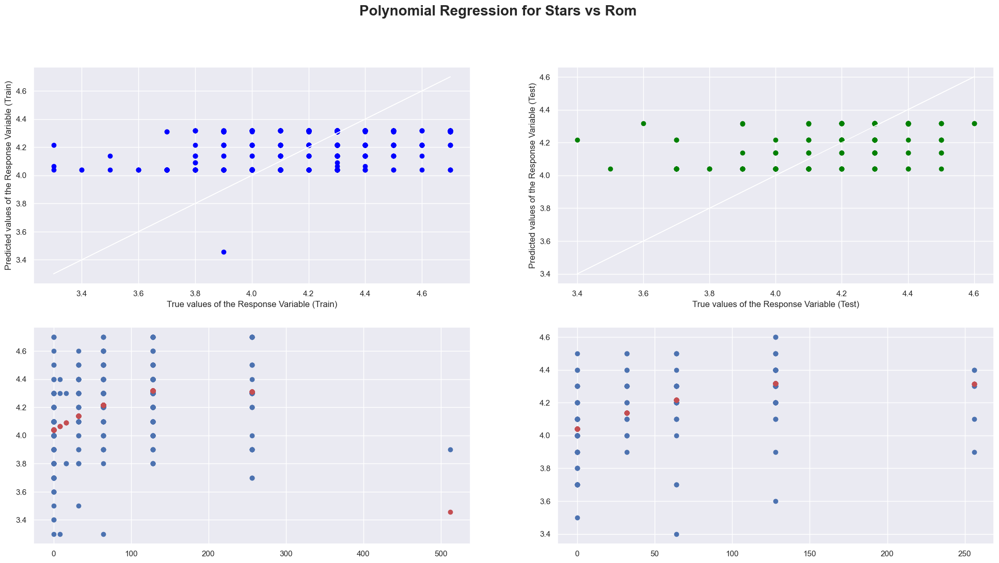

In [134]:
#create polynomial regression Stars vs Rom
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values

f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Rom", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 3: Linear Regression  Stars against Rom after removing outlier

#### Removing outlirs for Stars & Rom

<AxesSubplot:>

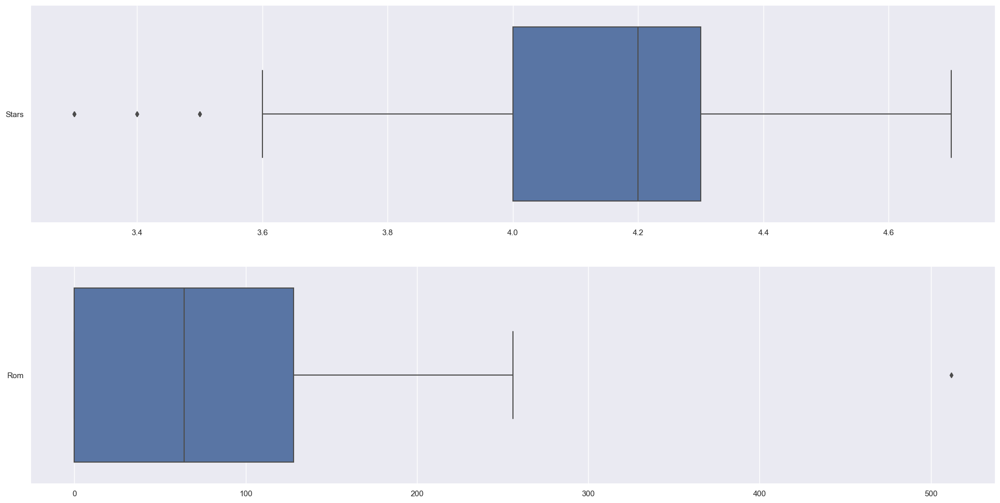

In [135]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = S, orient = "h", ax = axes[0])
sb.boxplot(data = rom, orient = "h", ax = axes[1])

In [107]:
#create copy of a dataframe to remove outlier
Linear2 = Linear1.copy()

In [108]:
# drop rows based on their values
Linear2 = Linear2.drop(Linear2[(Linear2['Rom'] > 300)].index)
print(Linear2['Rom'].unique())


[6.40e+01 0.00e+00 1.28e+02 3.20e+01 2.56e+02 1.25e-01 1.60e+01 8.00e+00]


<AxesSubplot:>

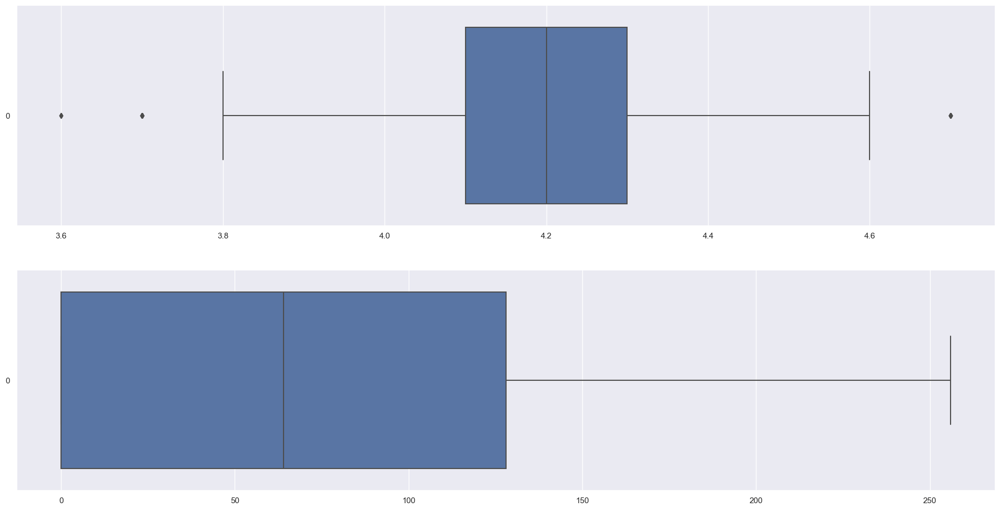

In [138]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = Linear2['Stars'], orient = "h", ax = axes[0])
sb.boxplot(data = Linear2['Rom'], orient = "h", ax = axes[1])

In [139]:
# Linear regression of Stars against Rom
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear2['Stars'])   # Response
rom= pd.DataFrame(Linear2['Rom'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(rom, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (746, 1) (746, 1)
Test Set  : (187, 1) (187, 1)


Intercept of Regression 	: b =  [4.09159555]
Coefficients of Regression 	: a =  [[0.00138788]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.18393089062698265
Mean Squared Error (MSE) 	: 0.04182425305417913

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2364044652802635
Mean Squared Error (MSE) 	: 0.03654925602971778



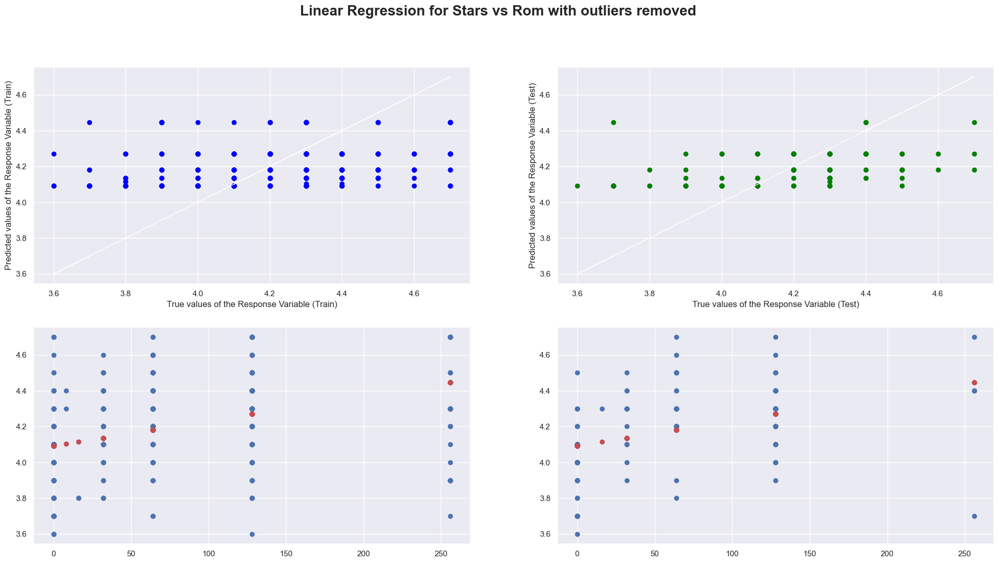

In [140]:
# Linear Regression using Train Data without outlier: Stars against Rom
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Rom with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 4: Polynomial Regression  Stars against Rom after removing outlier

Intercept of Regression 	: b =  [4.04729027]
Coefficients of Regression 	: a =  [[ 0.00000000e+00  3.51393987e-03 -1.06652906e-05]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.2662798288174759
Mean Squared Error (MSE) 	: 0.03760379820536333

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.32589458634093516
Mean Squared Error (MSE) 	: 0.0322658400089871



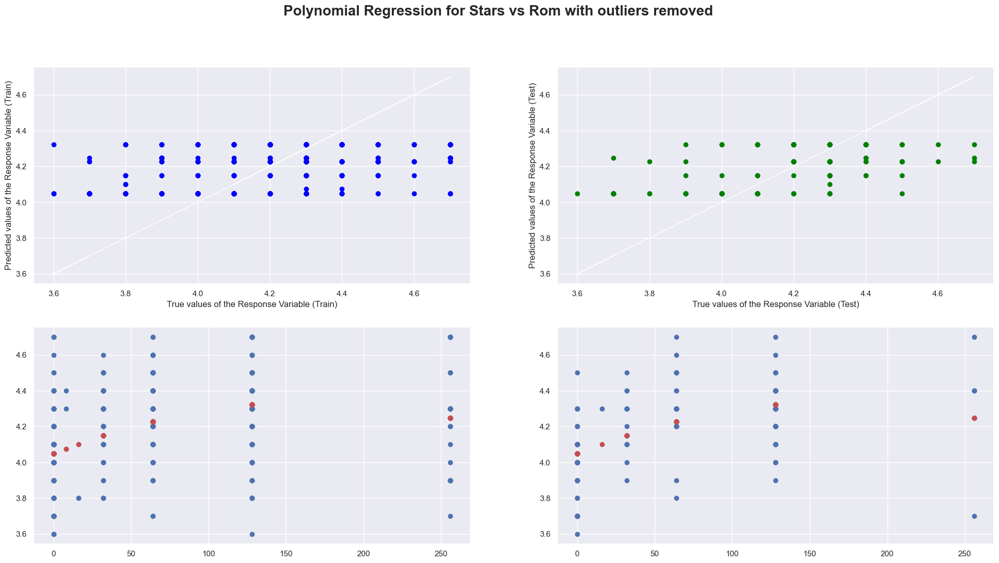

In [141]:
#create polynomial regression Stars vs Rom
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))

plt.suptitle("Polynomial Regression for Stars vs Rom with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 1: Linear Regression  Stars against Ram 

In [142]:
# Linear regression of Stars against Ram
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear['Stars'])   # Response
ram= pd.DataFrame(Linear['Ram'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(ram, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (754, 1) (754, 1)
Test Set  : (189, 1) (189, 1)


Intercept of Regression 	: b =  [4.06844049]
Coefficients of Regression 	: a =  [[0.03315706]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.18521298645868323
Mean Squared Error (MSE) 	: 0.045403154876042864

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.23498304181337692
Mean Squared Error (MSE) 	: 0.04367285018541827



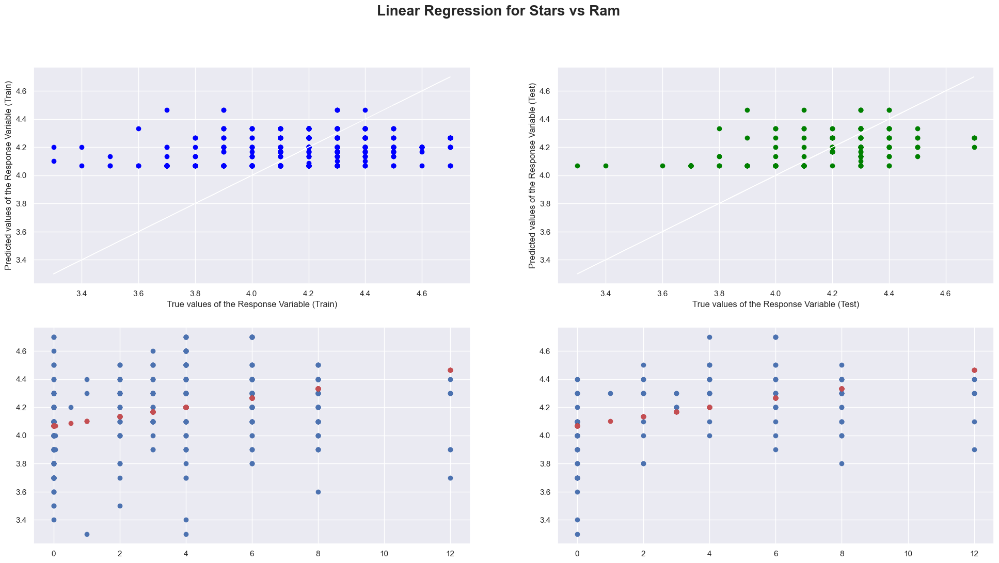

In [143]:
# Linear Regression using Train Data : Stars against Ram
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Ram", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 2: Polynomial Regression  Stars against Ram

Intercept of Regression 	: b =  [4.02371355]
Coefficients of Regression 	: a =  [[ 0.          0.09682713 -0.00821593]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.2779274105636822
Mean Squared Error (MSE) 	: 0.04023674047949218

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.3533109179776871
Mean Squared Error (MSE) 	: 0.036917816126131445



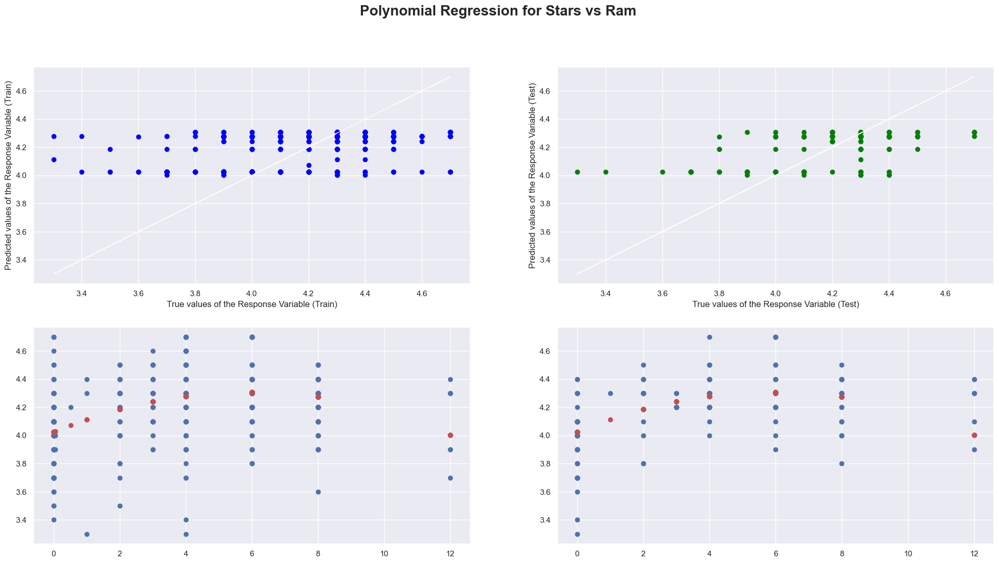

In [144]:
#create polynomial regression Stars vs Ram
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Ram", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 3: Linear Regression  Stars against Ram after removing outliers

<AxesSubplot:>

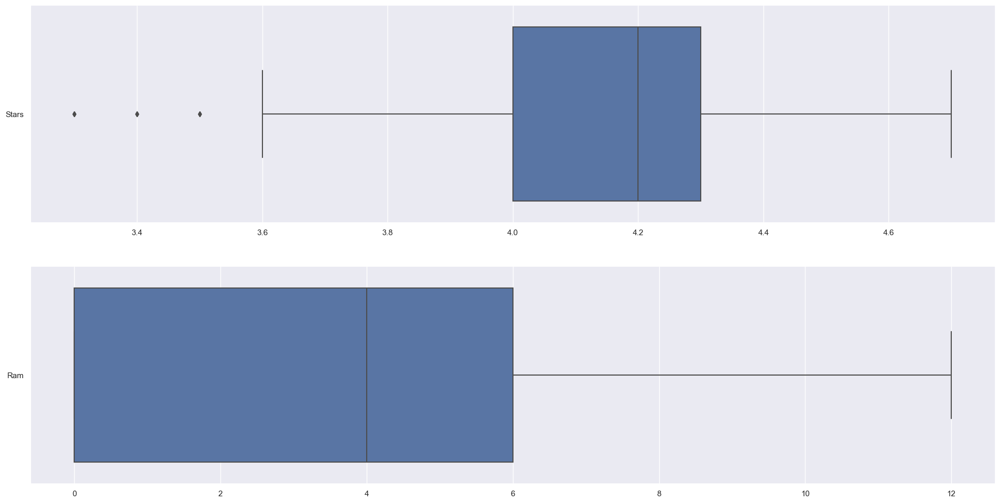

In [145]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = S, orient = "h", ax = axes[0])
sb.boxplot(data = ram, orient = "h", ax = axes[1])

In [146]:
#ram has no outliers can just use Linear 2 directly ( linear 2 removed outlires for stars )

# Linear regression of Stars against Ram
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear2['Stars'])   # Response
ram= pd.DataFrame(Linear2['Ram'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(ram, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (746, 1) (746, 1)
Test Set  : (187, 1) (187, 1)


Intercept of Regression 	: b =  [4.06912693]
Coefficients of Regression 	: a =  [[0.03200012]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.21040470677943157
Mean Squared Error (MSE) 	: 0.0391259254719013

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.150172853655415
Mean Squared Error (MSE) 	: 0.04603390366178158



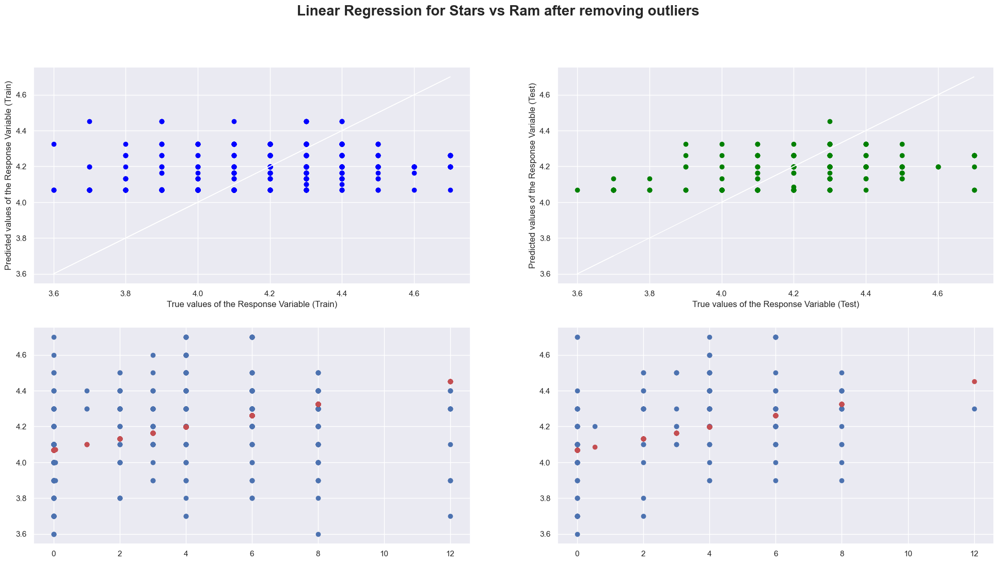

In [147]:
# Linear Regression using Train Data : Stars against Ram
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Ram after removing outliers", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 4: Polynomial Regression  Stars against Ram after removing outliers

Intercept of Regression 	: b =  [4.02059486]
Coefficients of Regression 	: a =  [[ 0.          0.09590758 -0.00781767]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.33316721091445045
Mean Squared Error (MSE) 	: 0.033042813491915145

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2340539475211404
Mean Squared Error (MSE) 	: 0.04149018649450959



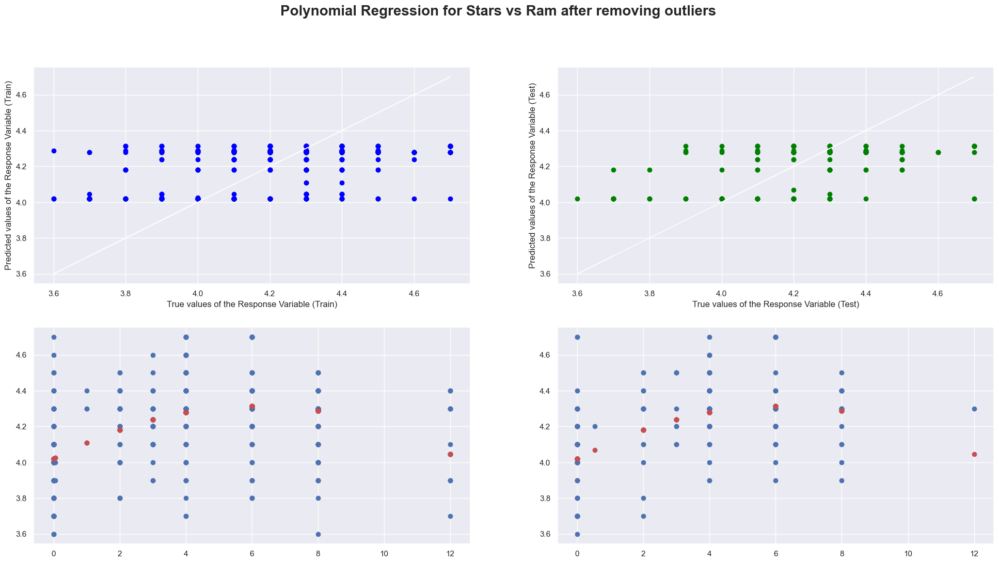

In [148]:
#create polynomial regression Stars vs Ram
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Ram after removing outliers", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 1: Linear Regression  Stars against Battery

In [106]:
# Linear regression of Stars against Battery
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear['Stars'])   # Response
B= pd.DataFrame(Linear['Battery'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(B, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (754, 1) (754, 1)
Test Set  : (189, 1) (189, 1)


Intercept of Regression 	: b =  [3.95305113]
Coefficients of Regression 	: a =  [[6.27930876e-05]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.23687455690815495
Mean Squared Error (MSE) 	: 0.04475041661658099

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.16199229923355962
Mean Squared Error (MSE) 	: 0.037820959515904515



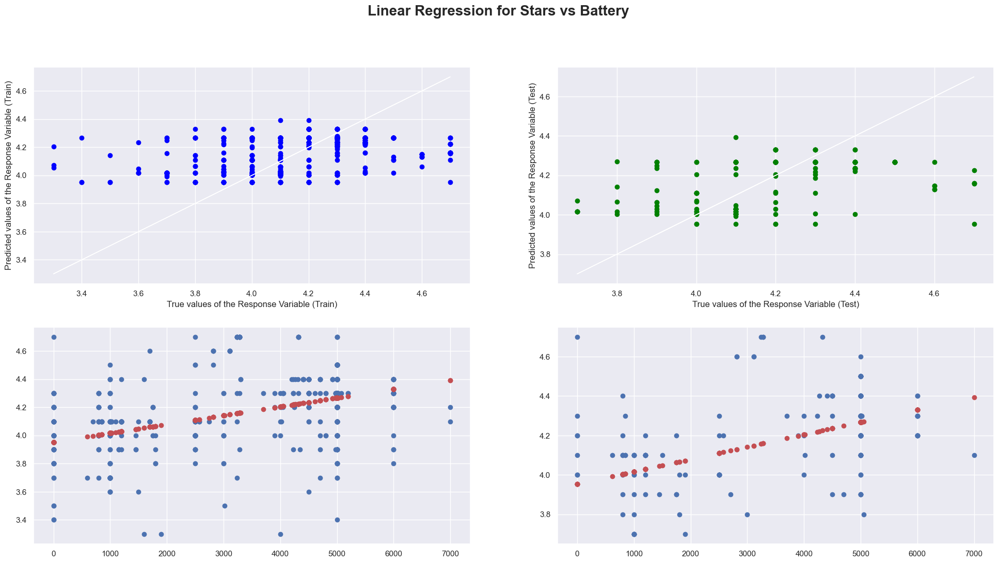

In [150]:
# Linear Regression using Train Data : Stars against Battery
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Battery", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 2: Polynomial Regression  Stars against Battery

Intercept of Regression 	: b =  [3.93993712]
Coefficients of Regression 	: a =  [[ 0.00000000e+00  9.65648691e-05 -6.21779035e-09]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.23804827929253225
Mean Squared Error (MSE) 	: 0.040827936712267726

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.21173389077014093
Mean Squared Error (MSE) 	: 0.05178622124727975



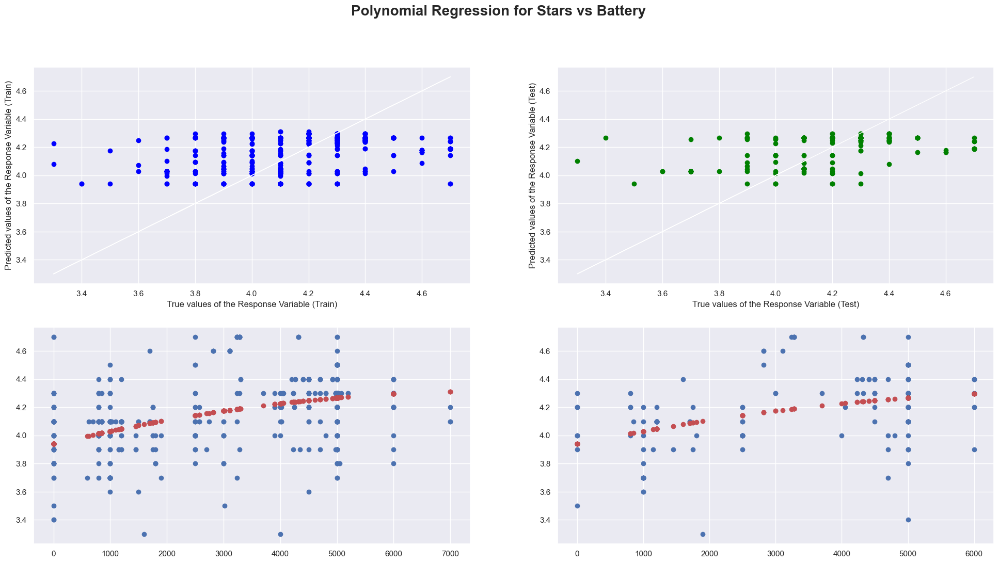

In [107]:
#create polynomial regression Stars vs Battery
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Battery", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 3: Linear Regression  Stars against Battery after removing outliers

<AxesSubplot:>

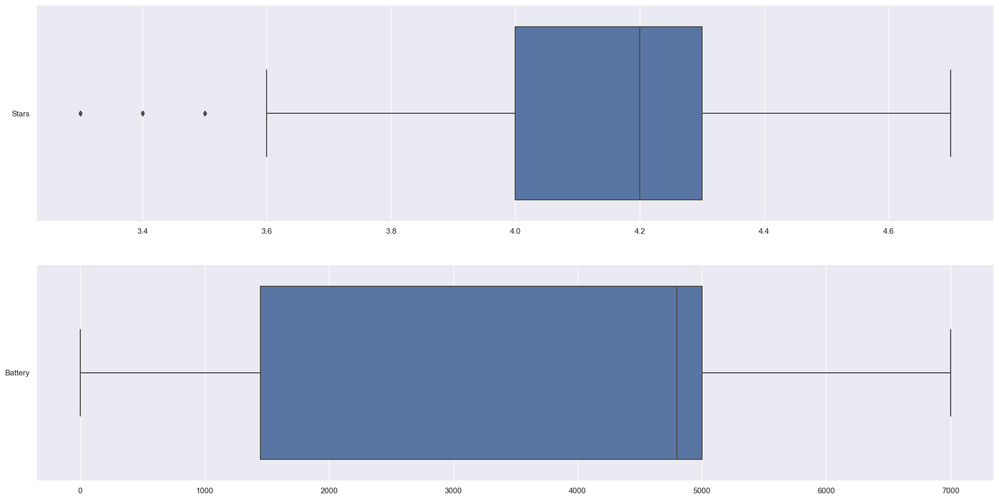

In [152]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = S, orient = "h", ax = axes[0])
sb.boxplot(data = B, orient = "h", ax = axes[1])

In [153]:
#Battery has no outliers can just use Linear 2 directly ( linear 2 removed outlires for stars )

# Linear regression of Stars against Battery
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear2['Stars'])   # Response
ram= pd.DataFrame(Linear2['Ram'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(ram, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (746, 1) (746, 1)
Test Set  : (187, 1) (187, 1)


Intercept of Regression 	: b =  [4.07134642]
Coefficients of Regression 	: a =  [[0.03315436]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.20534475525199025
Mean Squared Error (MSE) 	: 0.039504482126895384

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.1723423444557033
Mean Squared Error (MSE) 	: 0.04430189729459535



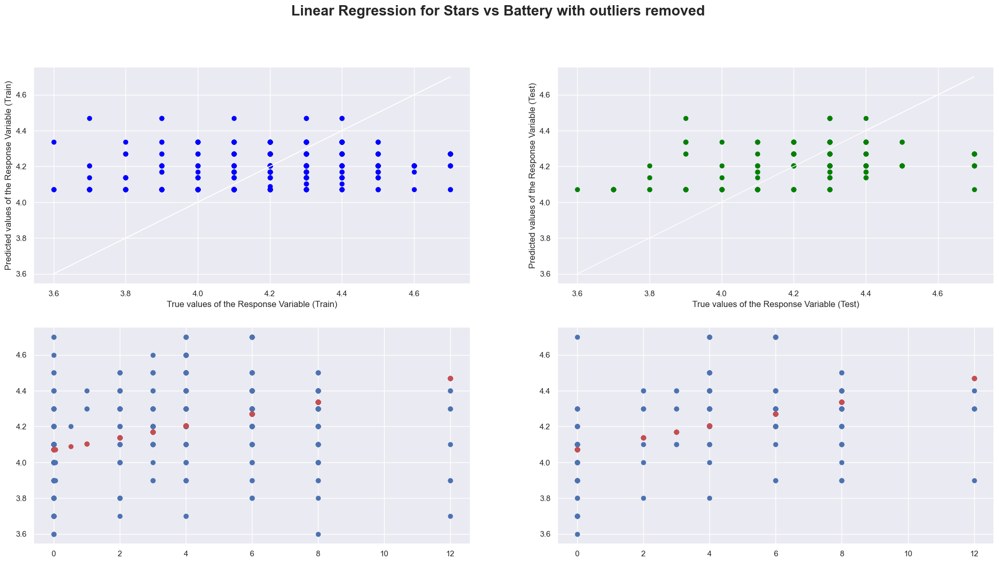

In [154]:
# Linear Regression using Train Data : Stars against Battery outliers reoved
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Battery with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 4: Polynomial Regression  Stars against Battery after removing outliers

Intercept of Regression 	: b =  [4.02519802]
Coefficients of Regression 	: a =  [[ 0.          0.09803815 -0.00834115]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3185099934911013
Mean Squared Error (MSE) 	: 0.033878729121489294

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2843203553364382
Mean Squared Error (MSE) 	: 0.03830806844028604



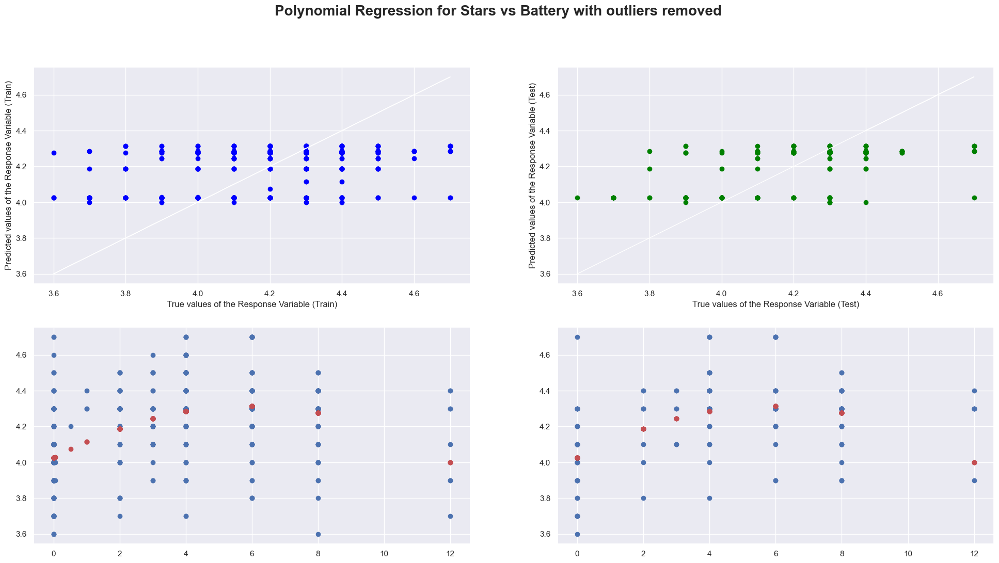

In [155]:
#create polynomial regression Stars vs Battery
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Battery with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 1: Linear Regression  Stars against Price

In [156]:
# Linear regression of Stars against Price
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear['Stars'])   # Response
P= pd.DataFrame(Linear['Price'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(P, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (754, 1) (754, 1)
Test Set  : (189, 1) (189, 1)


Intercept of Regression 	: b =  [4.09990807]
Coefficients of Regression 	: a =  [[0.00036365]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.1859703602265501
Mean Squared Error (MSE) 	: 0.04371243346180819

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.22424965181327294
Mean Squared Error (MSE) 	: 0.050746377582231446



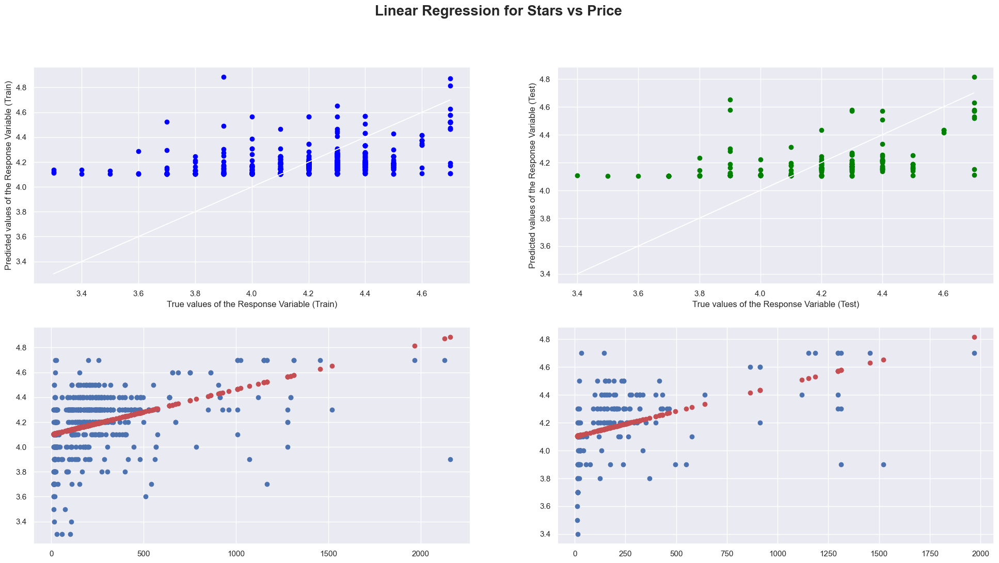

In [157]:
# Linear Regression using Train Data : Stars against Price
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Price", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 2: Polynomial Regression  Stars against Price

Intercept of Regression 	: b =  [4.04594903]
Coefficients of Regression 	: a =  [[ 0.00000000e+00  8.15500683e-04 -3.61127609e-07]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.25843717920913944
Mean Squared Error (MSE) 	: 0.03982105058311236

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.29977686622230726
Mean Squared Error (MSE) 	: 0.045805699760953236



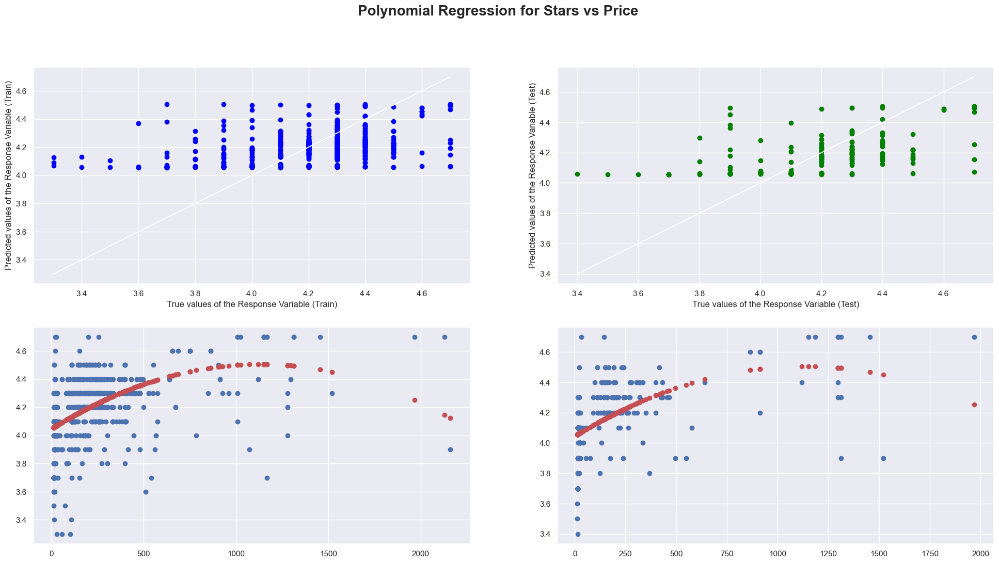

In [158]:
#create polynomial regression Stars vs Price
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Price", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Attempt 3: Linear Regression  Stars against Price after removing outliers

<AxesSubplot:>

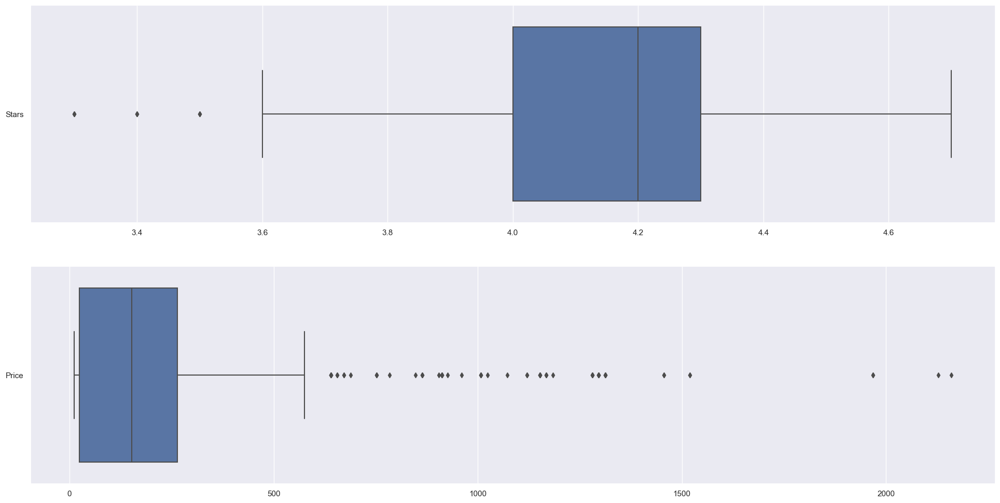

In [159]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = S, orient = "h", ax = axes[0])
sb.boxplot(data = P, orient = "h", ax = axes[1])

In [109]:
#create copy of a dataframe to remove outlier
Linear3 = Linear2.copy()

In [110]:
# drop rows based on their values
Linear3 = Linear3.drop(Linear3[(Linear3['Price']> 263)].index)
print(Linear3['Price'].unique())

[155.184  15.824 171.184 143.984  13.584 131.184 119.984 255.984 159.984
 215.984 191.984 207.984  89.584 127.984 151.984  27.984  20.784 167.984
 103.984 239.984 111.984 175.984 231.984  95.984 223.984  88.784 123.104
  99.984 148.784 247.984 188.4   255.84   15.984 199.984  32.944 175.68
  23.184  33.184  39.984 206.96  204.304 197.2    15.76  239.84   23.984
  26.864 135.984  19.808  15.6    15.376  33.568 155.12   15.12  177.584
  21.264 241.584  19.984  41.248  33.104  17.568  41.232  18.384  14.848
 145.328  18.064  19.04   41.584  21.04  201.392 123.184 132.784  22.24
 181.248 202.88   21.744 156.784 196.784 262.32   15.68  180.784 135.408
 110.736  23.68   30.576  93.584  21.28   15.344  14.384 182.768  24.784
  92.4    24.16   21.6   186.224 137.52  110.08   25.84  148.56   20.464
 107.584  18.544  21.2    19.92   17.584  15.552  35.2   249.584 106.544
  15.168 147.824  18.72  183.984 223.92   17.68   19.184  27.184  18.304
  17.728  27.92   21.584 186.144  25.44   29.904  31.

<AxesSubplot:>

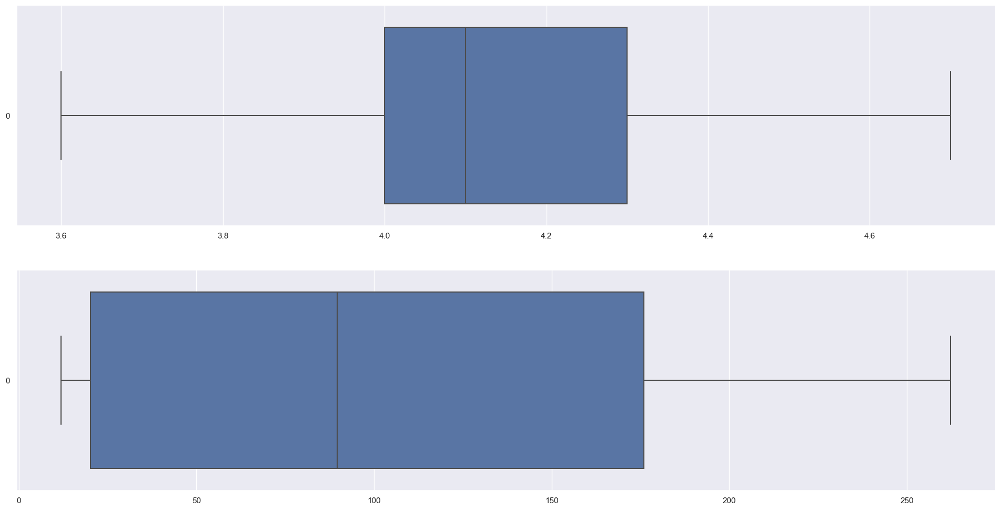

In [162]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = Linear3["Stars"], orient = "h", ax = axes[0])
sb.boxplot(data = Linear3["Price"], orient = "h", ax = axes[1])

In [163]:
# Linear regression of Stars against Price
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear3['Stars'])   # Response
P= pd.DataFrame(Linear3['Price'])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(P, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (548, 1) (548, 1)
Test Set  : (137, 1) (137, 1)


Intercept of Regression 	: b =  [4.00225376]
Coefficients of Regression 	: a =  [[0.00137249]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.30233033574082324
Mean Squared Error (MSE) 	: 0.03172138346295044

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.34738129210957946
Mean Squared Error (MSE) 	: 0.03112778089816519



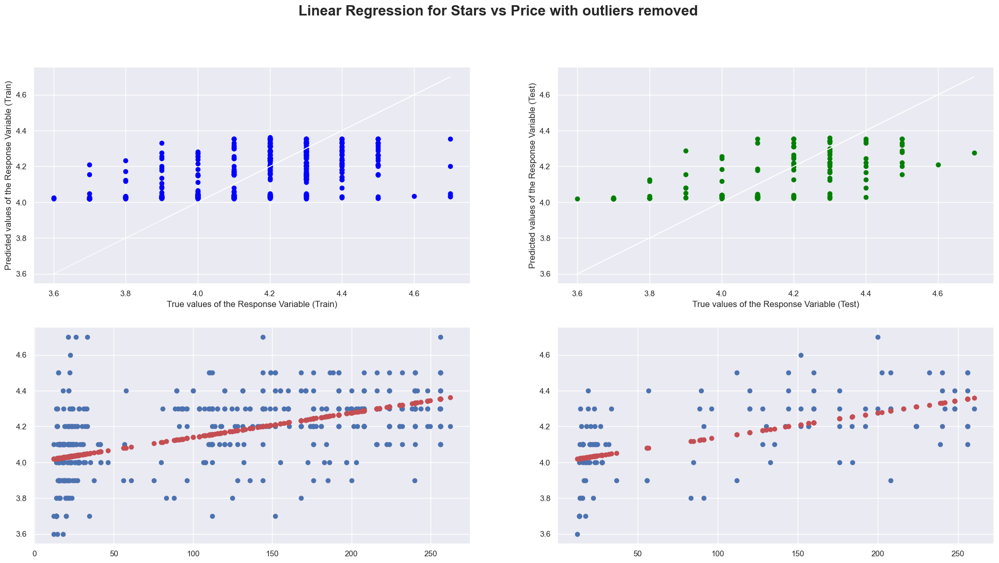

In [164]:
# Linear Regression using Train Data : Stars against Price
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

# Plot the Predictions vs the True values

f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Price with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)

### Attempt 4: Polynomial Regression  Stars against Price after removing outliers

Intercept of Regression 	: b =  [3.95491036]
Coefficients of Regression 	: a =  [[ 0.00000000e+00  3.08466185e-03 -7.19047347e-06]]

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3297948023038453
Mean Squared Error (MSE) 	: 0.03047263936516012

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.3744187353074736
Mean Squared Error (MSE) 	: 0.029838183162557604



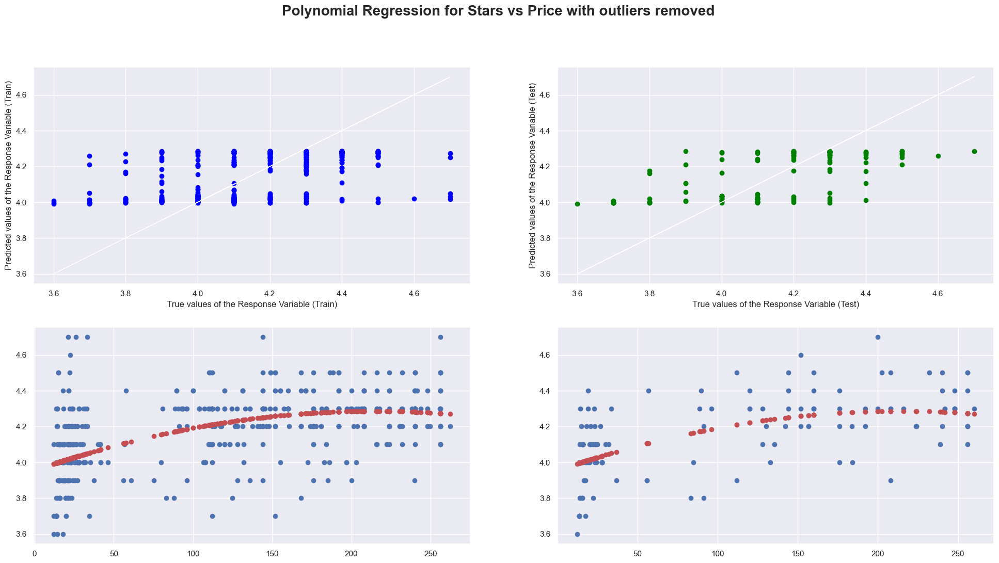

In [165]:
#create polynomial regression Stars vs Price
from sklearn.preprocessing import PolynomialFeatures

# create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# train the polynomial regression model
linreg_poly = LinearRegression()
linreg_poly.fit(X_train_poly, y_train)

# Coefficients of the Polynomial Regression line
print('Intercept of Regression \t: b = ', linreg_poly.intercept_)
print('Coefficients of Regression \t: a = ', linreg_poly.coef_)
print()

# Predict Total values corresponding to HP
y_train_pred_poly = linreg_poly.predict(X_train_poly)
y_test_pred_poly = linreg_poly.predict(X_test_poly)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred_poly))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg_poly.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred_poly))
print()

# Plot the Predictions vs the True values
f, axes = plt.subplots(2, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Price with outliers removed", fontsize=20, fontweight='bold')
axes[0,0].scatter(y_train, y_train_pred_poly, color = "blue")
axes[0,0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0,0].set_xlabel("True values of the Response Variable (Train)")
axes[0,0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[0,1].scatter(y_test, y_test_pred_poly, color = "green")
axes[0,1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[0,1].set_xlabel("True values of the Response Variable (Test)")
axes[0,1].set_ylabel("Predicted values of the Response Variable (Test)")
axes[1,0].scatter(X_train, y_train)
axes[1,0].scatter(X_train, y_train_pred_poly, color = "r")
axes[1,0].plot(X_train, y_train, 'w-', linewidth = 0)
axes[1,1].scatter(X_test, y_test)
axes[1,1].scatter(X_test, y_test_pred_poly, color = "r")
axes[1,1].plot(X_test, y_test, 'w-', linewidth = 0)


### Analysis for univariate linear regression

<b>Analysis of each variable:
- Screensize: MSE did not decrease after changing to polynomial. After removing outliers, linear mse dropped from 0.0489 to 0.0315. For polynomial it dropped from 0.04904 to 0.0315. Suggest it is heavily affected by outliers.
- Rom: MSE did not decrease after changing to polynomial or removing outliers. 
- Ram: MSE decrease after changing to polynomial. However removing outlires increased MSE instead.
- Battery: MSE decrease slightly after changing to polynomial from 0.0378 to 0.0376. MSE did not decrease after removing outlires. Suggests polynomial is a better choice for batttery.
- Price: MSE decreased after changing to polynomial from 0.0507 to 0.0458. MSE decreased after removing outliers with linear dropping from 0.0507 to 0.3112 and polynomial dropping from 0.0458 to 0.0298. Signficant drop after removing outliers suggest it is heavily affected by outliers.

<b> Lowest MSE for test for each variable:

- Screensize : 0.0315 linear without outlier
- Rom: 0.0315 linear with outlier
- Ram: 0.0369 **polynomial** with outlier
- Battery: 0.0376 **polynomial** with outlier
- Price: 0.0298 **polynomial** without outlier.

<b> Highest R^2 for test for each :

- Screensize: 0.4131736150000693 **polynomial** without outlier
- Rom: 0.4131736150000693 linear with outlier
- Ram: 0.3533109179776871 **polynomial** with outlier
- Battery: 0.2843203553364382 **polynomial** without outlier
- Price: 0.3744187353074736 **polynomial** without outlier
    
    
<b>Conclusion:
<br>
In conclusion polynomial seems to fair the best as the many of the lowest mse and highest R^2 is reached with polynomial for univariate.


### Multivariate Regression

Since lowest MSE of 0.0298 is reached with Price with polynomial regression, price is chosen as primary predictor and subsequent variables compatitible with polynomial regression is added on as predictor. The ranking of predictor is as follows: Price , Ram , Battery and ScreenSize. Polynomial and Linear regression is conducted.



### Attempt 1 : Polynomial Price& Ram vs Stars (2 predictor)

In [130]:

#Polynomial for Stars against Price,Rom,Ram
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear3['Stars'])   # Response
PR= pd.DataFrame(Linear3[['Price','Ram']])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(PR, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (548, 2) (548, 1)
Test Set  : (137, 2) (137, 1)


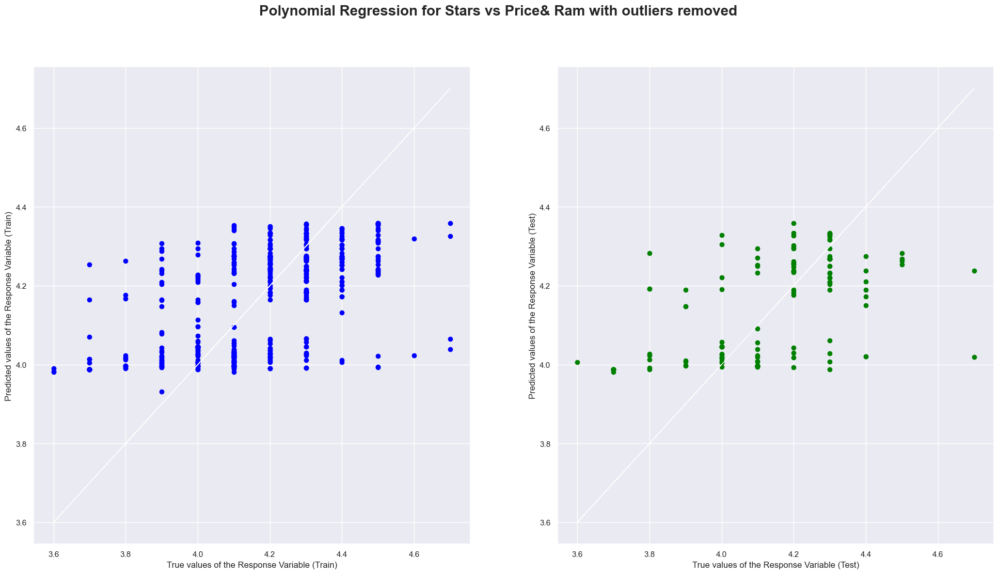

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3635922059663619
Mean Squared Error (MSE) 	: 0.029080058056459208

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.28517474218624594
Mean Squared Error (MSE) 	: 0.03326075945196376



In [188]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Perform polynomial regression using linear regression
linreg = LinearRegression()
linreg.fit(X_train_poly, y_train)


# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train_poly)
y_test_pred = linreg.predict(X_test_poly)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Price& Ram with outliers removed", fontsize=20, fontweight='bold')
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()


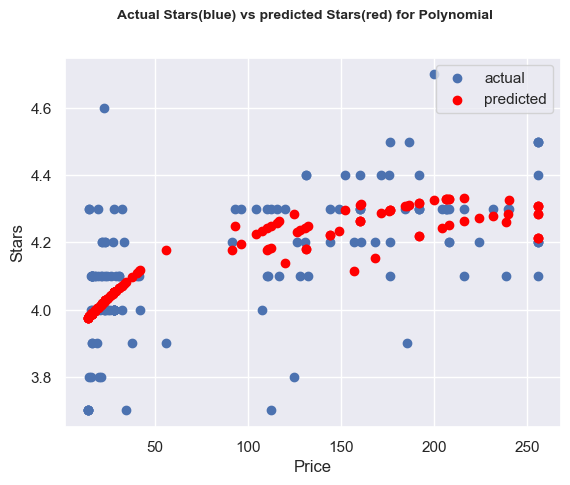

In [131]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Perform polynomial regression using linear regression
linreg = LinearRegression()
linreg.fit(X_train_poly, y_train)


# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train_poly)
y_test_pred = linreg.predict(X_test_poly)

# Create a scatter plot of the test set and predicted response variable
plt.scatter(X_test.iloc[:,0], y_test, label='actual')
plt.scatter(X_test.iloc[:,0], y_test_pred, color='red', label='predicted')
plt.xlabel('Price')
plt.ylabel('Stars')
plt.legend()
plt.suptitle("Actual Stars(blue) vs predicted Stars(red) for Polynomial", fontsize=10, fontweight='bold')
plt.show()

### Attempt 2 : Linear Price& Ram vs Stars (2 predictor)

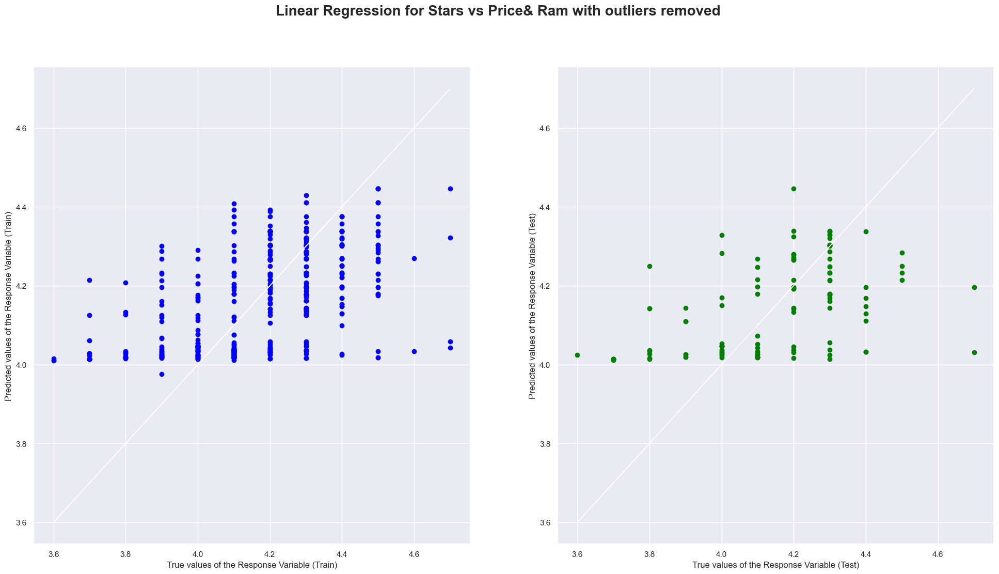

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.33934698811698616
Mean Squared Error (MSE) 	: 0.030187920576782275

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.2685715817535982
Mean Squared Error (MSE) 	: 0.03403330311806424



In [189]:
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model


# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Price& Ram with outliers removed", fontsize=20, fontweight='bold')
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

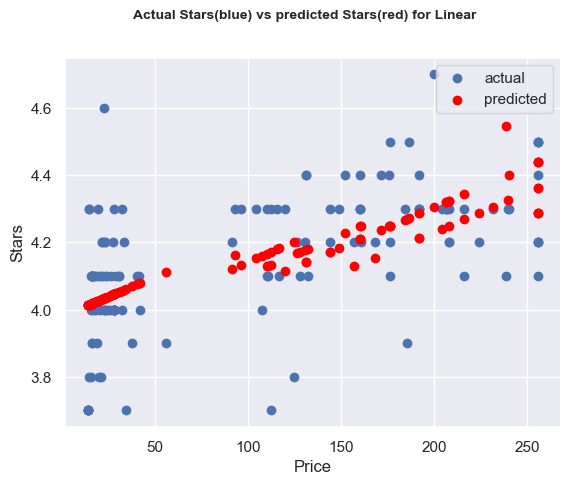

In [132]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Create a linear regression object
lr = LinearRegression()

# Fit the model to the training data
lr.fit(X_train, y_train)

# Predict the response variable for the test set
y_test_pred = lr.predict(X_test)

# Create a scatter plot of the test set and predicted response variable
plt.scatter(X_test.iloc[:,0], y_test, label='actual')
plt.scatter(X_test.iloc[:,0], y_test_pred, color='red', label='predicted')
plt.xlabel('Price')
plt.ylabel('Stars')
plt.suptitle("Actual Stars(blue) vs predicted Stars(red) for Linear", fontsize=10, fontweight='bold')
plt.legend()
plt.show()

MSE for test increased to 0.0245 from 0.0201. Indicates that adding more predictors makes the model harder to predict
the value of stars.


### Attempt 3: Polynomial Price, Ram , Battery vs Stars (3 predictor)

In [137]:

#Polynomial for Stars against Price,Rom,Ram
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear3['Stars'])   # Response
PRB= pd.DataFrame(Linear3[['Price','Ram','Battery']])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(PRB, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)

Train Set : (548, 3) (548, 1)
Test Set  : (137, 3) (137, 1)


<AxesSubplot:>

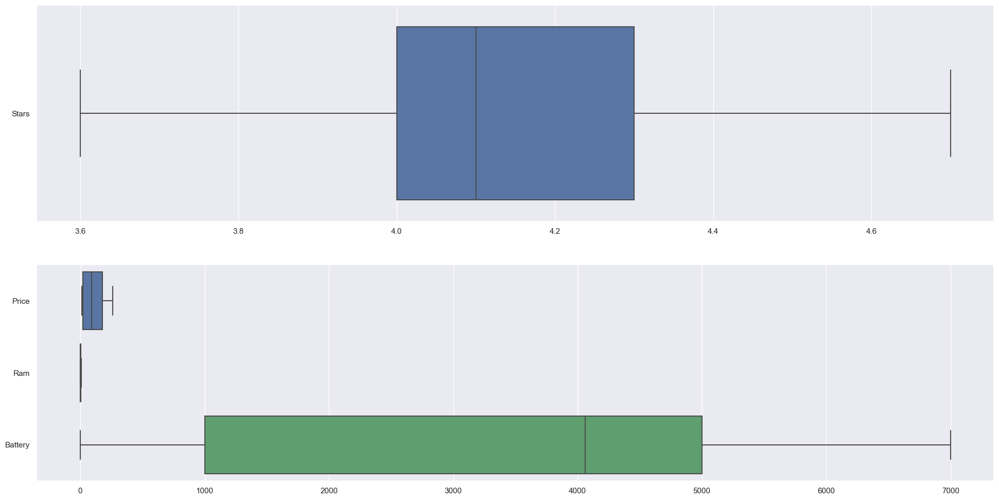

In [193]:
f, axes = plt.subplots(2, 1, figsize=(24, 12))
sb.boxplot(data = S, orient = "h", ax = axes[0])
sb.boxplot(data = PRB, orient = "h", ax = axes[1])

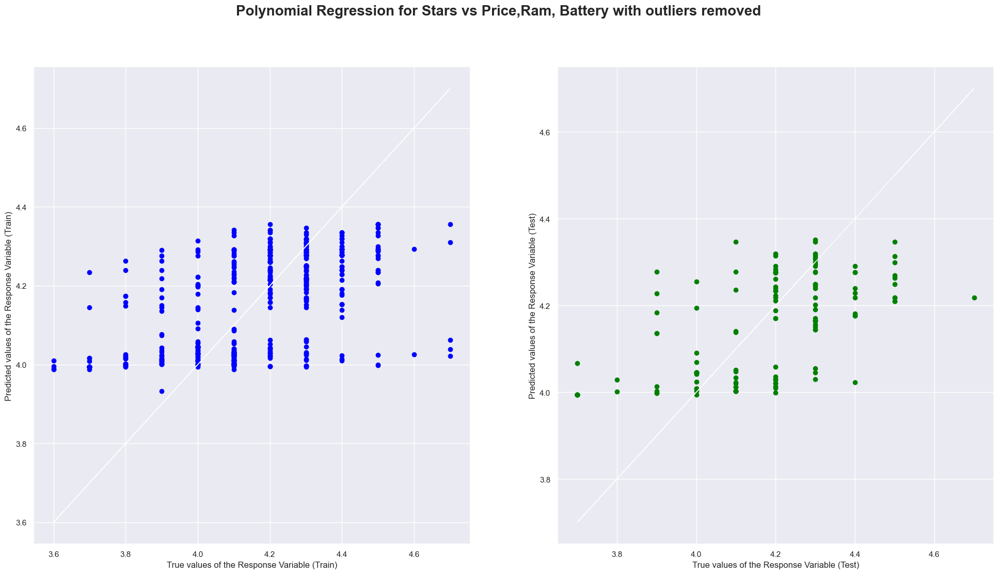

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.33607611135716264
Mean Squared Error (MSE) 	: 0.03012410055825894

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.38413601835643596
Mean Squared Error (MSE) 	: 0.029486920372112126



In [194]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Perform polynomial regression using linear regression
linreg = LinearRegression()
linreg.fit(X_train_poly, y_train)

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train_poly)
y_test_pred = linreg.predict(X_test_poly)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Price,Ram, Battery with outliers removed", fontsize=20, fontweight='bold')
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()


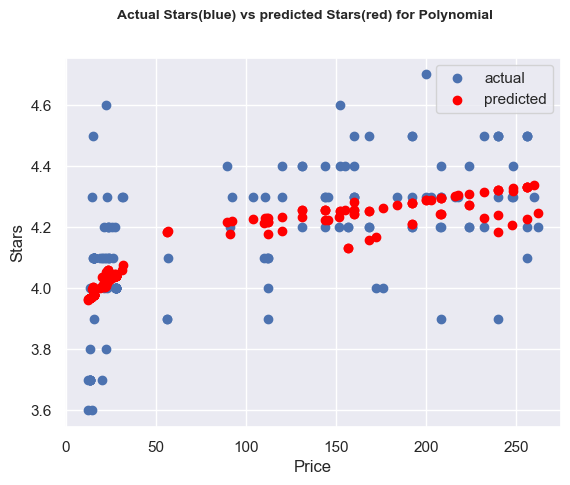

In [138]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Perform polynomial regression using linear regression
linreg = LinearRegression()
linreg.fit(X_train_poly, y_train)


# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train_poly)
y_test_pred = linreg.predict(X_test_poly)

# Create a scatter plot of the test set and predicted response variable
plt.scatter(X_test.iloc[:,0], y_test, label='actual')
plt.scatter(X_test.iloc[:,0], y_test_pred, color='red', label='predicted')
plt.xlabel('Price')
plt.ylabel('Stars')
plt.legend()
plt.suptitle("Actual Stars(blue) vs predicted Stars(red) for Polynomial", fontsize=10, fontweight='bold')
plt.show()

### Attempt 4: Linear Regression Price, Ram , Battery vs Stars (3 predictor)

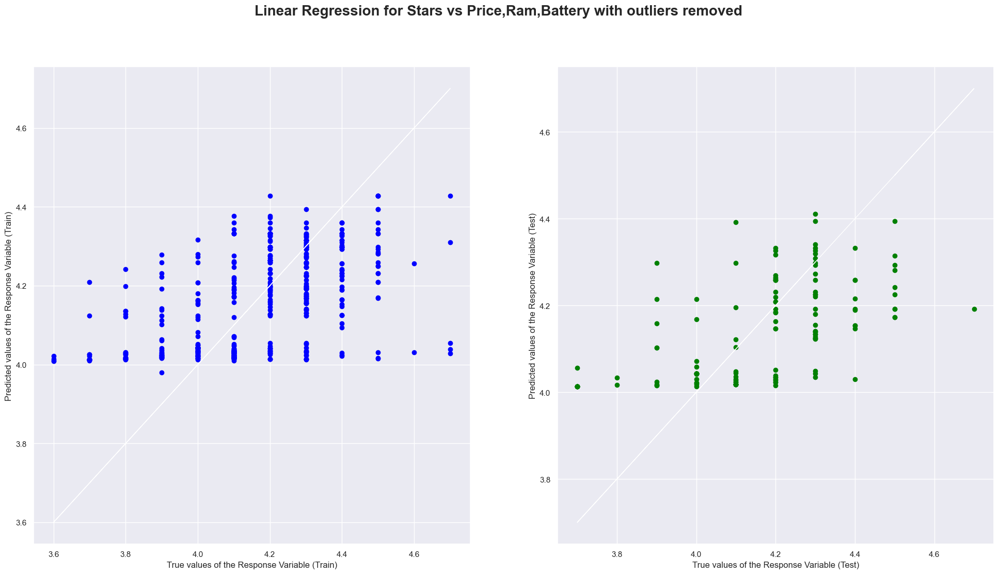

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.3242127102704859
Mean Squared Error (MSE) 	: 0.03066237654653304

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.33032901776552326
Mean Squared Error (MSE) 	: 0.03206314302707604



In [196]:
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model


# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Price,Ram,Battery with outliers removed", fontsize=20, fontweight='bold')
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

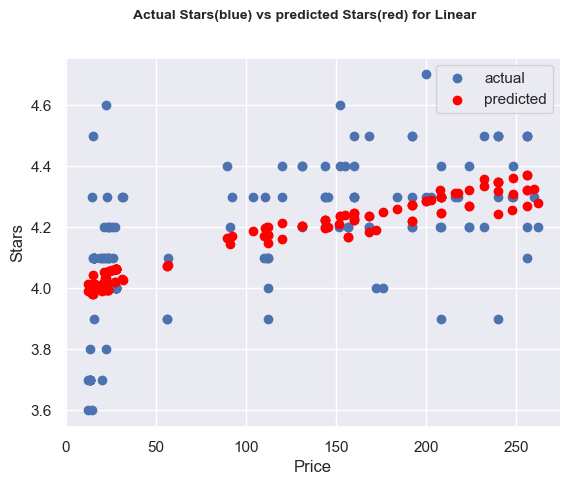

In [139]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Create a linear regression object
lr = LinearRegression()

# Fit the model to the training data
lr.fit(X_train, y_train)

# Predict the response variable for the test set
y_test_pred = lr.predict(X_test)

# Create a scatter plot of the test set and predicted response variable
plt.scatter(X_test.iloc[:,0], y_test, label='actual')
plt.scatter(X_test.iloc[:,0], y_test_pred, color='red', label='predicted')
plt.xlabel('Price')
plt.ylabel('Stars')
plt.legend()
plt.suptitle("Actual Stars(blue) vs predicted Stars(red) for Linear", fontsize=10, fontweight='bold')
plt.show()

### Attempt 5: Polynomial Regression Price,Ram,Battery,ScreenSize VS Stars (4predictor)

In [140]:
#Polynomial for Stars against Price,Rom,Ram
from sklearn.model_selection import train_test_split
# Recall the Total-HP Dataset
S = pd.DataFrame(Linear3['Stars'])   # Response
PRBS= pd.DataFrame(Linear3[['Price','Ram','Battery','ScreenSize']])         # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(PRBS, S, test_size = 0.2)

# Check the sample sizes
print("Train Set :", X_train.shape,  y_train.shape)
print("Test Set  :",X_test.shape,  y_test.shape)


Train Set : (548, 4) (548, 1)
Test Set  : (137, 4) (137, 1)


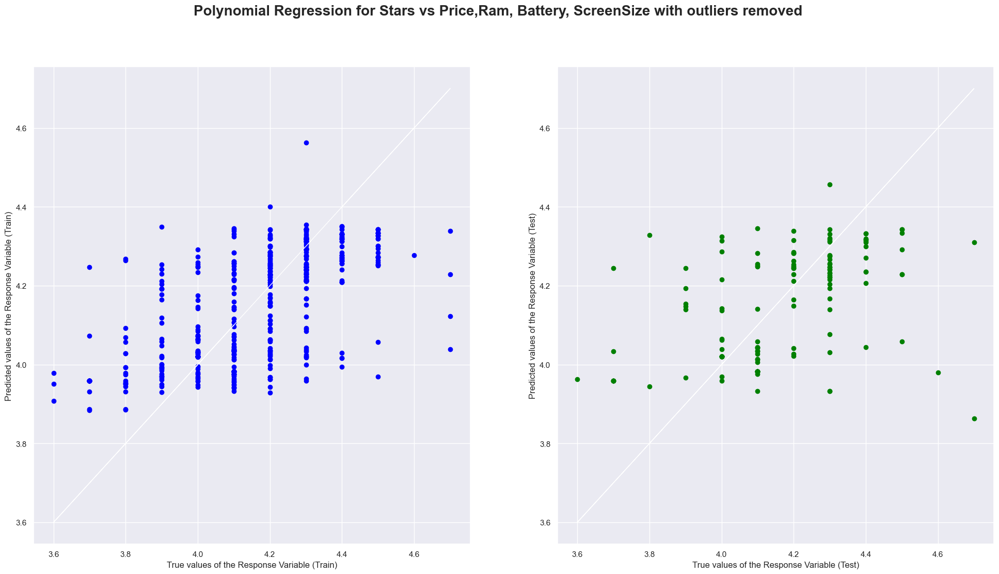

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.4291521675331773
Mean Squared Error (MSE) 	: 0.02635377155704498

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.16377432648079282
Mean Squared Error (MSE) 	: 0.036859156039343616



In [204]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Perform polynomial regression using linear regression
linreg = LinearRegression()
linreg.fit(X_train_poly, y_train)

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train_poly)
y_test_pred = linreg.predict(X_test_poly)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
plt.suptitle("Polynomial Regression for Stars vs Price,Ram, Battery, ScreenSize with outliers removed", fontsize=20, fontweight='bold')
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train_poly, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test_poly, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()


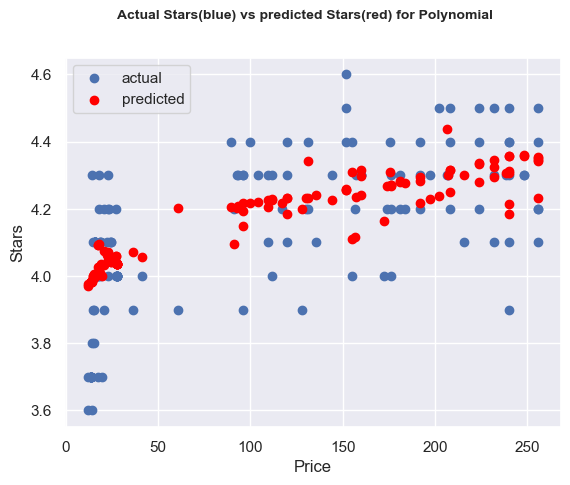

In [141]:
from sklearn.preprocessing import PolynomialFeatures

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Perform polynomial regression using linear regression
linreg = LinearRegression()
linreg.fit(X_train_poly, y_train)


# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train_poly)
y_test_pred = linreg.predict(X_test_poly)

# Create a scatter plot of the test set and predicted response variable
plt.scatter(X_test.iloc[:,0], y_test, label='actual')
plt.scatter(X_test.iloc[:,0], y_test_pred, color='red', label='predicted')
plt.xlabel('Price')
plt.ylabel('Stars')
plt.legend()
plt.suptitle("Actual Stars(blue) vs predicted Stars(red) for Polynomial", fontsize=10, fontweight='bold')
plt.show()

### Attempt 6: Linear Regression Price,Ram,Battery,ScreenSize VS Stars (4predictor)

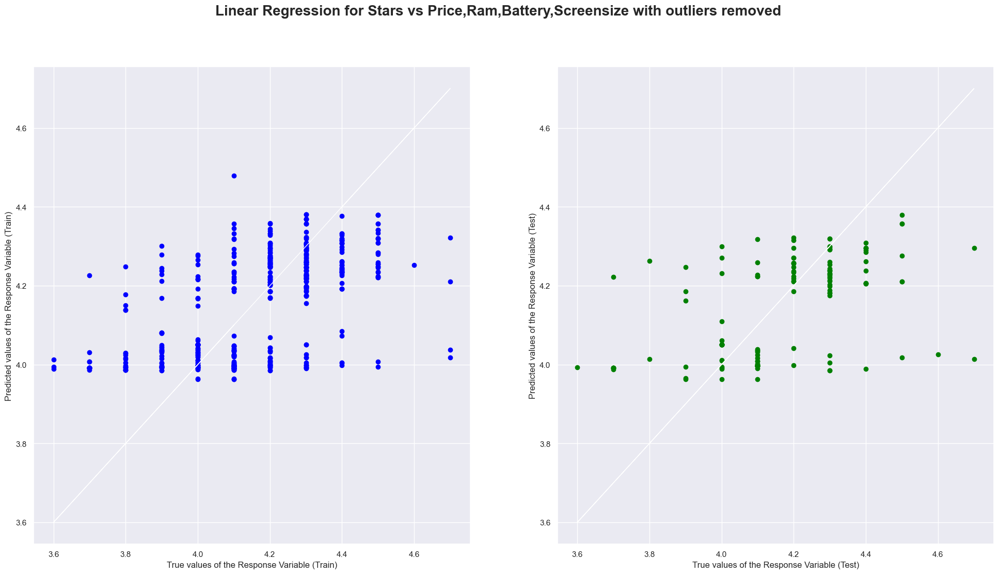

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.36385184866691345
Mean Squared Error (MSE) 	: 0.029368427281613634

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.23498889062371742
Mean Squared Error (MSE) 	: 0.033720160412755



In [206]:
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model


# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
plt.suptitle("Linear Regression for Stars vs Price,Ram,Battery,Screensize with outliers removed", fontsize=20, fontweight='bold')
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
print()

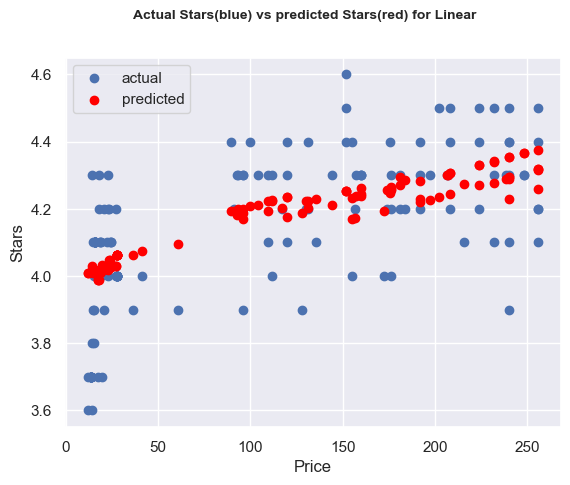

In [142]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

# Create a linear regression object
lr = LinearRegression()

# Fit the model to the training data
lr.fit(X_train, y_train)

# Predict the response variable for the test set
y_test_pred = lr.predict(X_test)

# Create a scatter plot of the test set and predicted response variable
plt.scatter(X_test.iloc[:,0], y_test, label='actual')
plt.scatter(X_test.iloc[:,0], y_test_pred, color='red', label='predicted')
plt.xlabel('Price')
plt.ylabel('Stars')
plt.legend()
plt.suptitle("Actual Stars(blue) vs predicted Stars(red) for Linear", fontsize=10, fontweight='bold')
plt.show()

#### Summary of Multivariate

<B>MSE for each attempt:
- Attempt 1 MSE:0.0333 (Polynomial regression, 2 predictor : Price,Ram)
- Attempt 2 MSE:0.0340 (Linear regression, 2 predictor : Price,Ram)
- Attempt 3 MSE:0.0295 (Polynomial regression, 3 predictor : Price,Ram,Battery)
- Attempt 4 MSE:0.0321 (Linear regression, 3 predictor : Price,Ram,Battery)
- Attempt 5 MSE:0.0369 (Polynomial regression, 4 predictor : Price,Ram,Battery,Scrensize)
- Attempt 6 MSE:0.0337 (Linear regression, 4 predictor : Price,Ram,Battery,Scrensize)
    
<B>Analysis:
    
 Attempt 3 gives the lowest MSE of 0.0295 which is polynomial with 3 predictor, Price,Ram,Battery. This is pretty close to the lowest MSE achieved of 0.0298 for univariate regression for polynomial regression of price.
